## Table Of Contents
>• Introduction <br>
• Data Introduction <br>
• Data Preparation (Import libraries, data cleaning & data wrangling)<br>
• Basic exploratory data analysis <br>
&nbsp;&nbsp;&nbsp; * Descriptive statistic <Br>
&nbsp;&nbsp;&nbsp; * Univariate analysis <Br>
&nbsp;&nbsp;&nbsp; * Multivariate analysis <Br>
• Deep exploratory data analysis <br>
&nbsp;&nbsp;&nbsp; * Services and internet services analysis <Br>
&nbsp;&nbsp;&nbsp; * Monthly charges analysis <Br>
&nbsp;&nbsp;&nbsp; * Customer analysis <Br> 
&nbsp;&nbsp;&nbsp; * Benefits analysis <Br> 
&nbsp;&nbsp;&nbsp; * Churn analysis <Br> 
• Modelling<br>
&nbsp;&nbsp;&nbsp; * Features selection and encoding <Br>
&nbsp;&nbsp;&nbsp; * Splits data and define custom metrics <Br>
&nbsp;&nbsp;&nbsp; * Model building combination 1 <Br> 
&nbsp;&nbsp;&nbsp; * Model building combination 2 <Br>
&nbsp;&nbsp;&nbsp; * Model building combination 3 <Br>  
• Model interpretation<br>
&nbsp;&nbsp;&nbsp; * PDP and ICE plots <Br>
&nbsp;&nbsp;&nbsp; * Checking prediction's confidence using confidence interval <Br>

# Introduction
***
>This project is a final project created as one of the requirements to pass the Dibimbing Data Science Bootcamp. The dataset I used is the telco customer churn dataset, which is popular and commonly used for practice. I chose this dataset because it has numerous columns and it represents a 'real-life' dataset from an actual telco company. The problem faced by the company is customer churn, which results in financial loss. The solution involves providing prospects and promotions to potential churned customers, but this action also incurs costs for the company. Therefore, accurately targeting the churned customers is crucial. Based on this problem, I set two main goals:<Br><br>
1.Look for useful information, insights, and patterns by performing exploratory data analysis.<br>
2.Create an ML model that best fits the company's goal of reducing losses.

# Data Introduction
***
>This dataset contain informations about customers that churn and not churned in a telco company. Below is the column informations:<Br>
1.customerID = customer unique ID.<Br>
2.gender = customer gender (M/F).<br>
3.SeniorCitizen = old / young customer.<br>
4.Partner = either a customer has partners or not.<br>
5.Dependents = either a customer has dependents or not.<br>
6.tenure = how long the customer subscribed (in month).<br>
7.MultipleLines = either a customer using multiple lines or not (phone lines).<br>
8.InternetService = either a customer using InternetService lines or not.<br>
9.OnlineSecurity = either a customer has OnlineSecurity or not.<br>
10.OnlineBackup = either a customer has OnlineBackup or not.<br>
11.DeviceProtection = either a customer has DeviceProtection or not.<br>
12.TechSupport = either a customer has TechSupport or not.<br>
13.StreamingTV = either a customer has StreamingTV or not.<br>
14.StreamingMovies = either a customer has StreamingMovie or not.<br>
15.Contract = types of contract.<Br>
16.PaperlessBilling = either a customer has PaperlessBilling or not.<br>
17.PaymentMethod = types of the payment method.<Br>
18.MonthlyCharges = how much charges per month.<br>
19.TotalCharges = total charges of all time.<br>
20.Churn = either a customer churn or not.<br>
21.Hobby = customer hobby.<br><br>

## Data Preparation (Import libraries, data cleaning & data wrangling)
***

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
import matplotlib as mpl
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix
from pdpbox import pdp, info_plots
mpl.rcParams['figure.dpi'] = 300 #set figure dpi
sns.set() #set figure styling

In [2]:
#dataset link
github = 'https://raw.githubusercontent.com/vertikalwil/Data-Analyst/main/telco.csv'

In [3]:
#import dataset
df = pd.read_csv('telco.csv')
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Hobby
0,7590-VHVEG,Female,0,Yes,No,135,No,No phone service,DSL,No,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,Swimming
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,No,No,No,One year,No,Mailed check,56.95,1889.5,No,Running
2,3668-QPYBK,Male,0,No,No,140,Yes,No,DSL,Yes,...,No,No,No,Month-to-month,Yes,Mailed check,53.85,7560,Yes,Hiking
3,7795-CFOCW,Male,0,No,No,136,No,No phone service,DSL,Yes,...,Yes,No,No,One year,No,Bank transfer (automatic),42.45,1840.75,No,Swimming
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Running


In [4]:
#take a look at the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  6627 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          6798 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


>There are 4 columns with missing values which are DeviceProtection, Contract, TotalCharges and Hobby.

In [5]:
#checking percentage of missing values
missingkolom = ['DeviceProtection','Contract','TotalCharges','Hobby']
for x in missingkolom:
    print(f'Missing value of column {x} (%) : {round(df[x].isna().sum()/len(df) * 100,2)}')

Missing value of column DeviceProtection (%) : 5.91
Missing value of column Contract (%) : 3.48
Missing value of column TotalCharges (%) : 31.01
Missing value of column Hobby (%) : 40.35


In [6]:
#impute missing values with univariate imputation by value proportion
df['DeviceProtection'] = df['DeviceProtection'].fillna(
                             pd.Series(np.random.choice(['No','Yes','No internet service'], 
                             p = list(df['DeviceProtection'].value_counts(normalize=True)), size=len(df))))

df['Contract'] = df['Contract'].fillna(
                     pd.Series(np.random.choice(['Month-to-month','Two year','One year'], 
                     p = list(df['Contract'].value_counts(normalize=True)), size=len(df))))

> Here I impute DeviceProtection and Contract with univariate imputation by value proportion for the following reasons:<br>
1.The missing values is not that much (<10%).<br>
2.The columns don't have any relationship with other columns so that multivariate imputation is not possible.<br>
3.Using proportion is more precise in this case rather than use 'mode'.

In [7]:
#delete column Hobby
df.drop(columns=['Hobby'],inplace=True)

> Reasons to delete:<br>
1.Missing values is too many.<br>
2.By business context, Hobby doesn't give enough useful informations.<br>
3.Cannot be imputed by multivariate imputation.<br>

In [8]:
#impute TotalCharges from tenure and MonthlyCharges
df['TotalCharges'] = df['TotalCharges'].fillna(df['tenure'] * df['MonthlyCharges'])

> Even this column has so many missing values, I decided to impute it with multivariate imputation because:<br>
1.By business context, TotalCharges is more or less tenure * MonthlyCharges.<br>
2.So even the missing values are high, it can still be imputed with a strong justification.<br>

In [9]:
#there's a space in the total charges column.
for x in df.TotalCharges:
    try:
        float(x)
    except:
        print(f'Unable to convert to float with this value : {x}')

Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  
Unable to convert to float with this value :  


In [10]:
df[df.TotalCharges == ' '].head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Month-to-month,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,No,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,Yes,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1334,1768-ZAIFU,Female,1,No,No,0,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,25.20,,Yes


>When the tenure value is 0, the TotalCharges value is empty ('space'). This is because customers who have just joined (less than a month) have not been charged yet, resulting in a TotalCharges value of 0. Since there are only 12 rows with this condition, I will delete them.

In [11]:
#drop rows that has empty TotalCharges.
df = df.drop(df.index[df.TotalCharges == ' ']).reset_index(drop=True)

In [12]:
#check for duplicate data, if True then there's no duplicate.
df.customerID.nunique() == len(df) 

True

In [13]:
#feature engineered 2 new features for the sake of easier analysis.
df['Services'] = df[['PhoneService','InternetService']].apply(
                     lambda x: 'Both' if list(x).count('No') == 0 else
                     'Internet Only' if x[0] == 'No' else 'Phone Only', axis=1)

df['TotalBenefits'] = df.loc[:,'OnlineSecurity':'StreamingMovies']\
                          .apply(lambda x: list(x).count('Yes'), axis=1)

>New features explanation: <Br>
1.Services = Combined values of PhoneService and InternetService.<br>
2.TotalBenefits = Sum of benefits taken on OnlineSecurity until StreamingMovies.

In [14]:
#Change values of 1 and 0 to 'Yes' and 'No'
df['SeniorCitizen'] = df.SeniorCitizen.apply(lambda x: 'Yes' if x == 1 else 'No')

>Change numerical value to strings for simpler and consistent analysis.

In [15]:
#drop useless column
df.drop(columns=['customerID'], inplace=True)

In [16]:
#change columns object data type to numerical
df.tenure = df.tenure.astype('int64')
df.MonthlyCharges = df.MonthlyCharges.astype('float64')
df.TotalCharges = df.TotalCharges.astype('float64')

In [17]:
#checking values of real totalcharges and calculated totalcharges
df['TotalChargesDiff'] = df[['tenure','MonthlyCharges','TotalCharges']].apply(
                             lambda x: round(abs(1 - (x[0] * x[1] / x[2])) * 100, 3), axis=1)

>Here, I have created a new column called TotalChargesDiff to check the differences (%) between the actual TotalCharges value (from the dataset) and the calculated TotalCharges value (obtained by multiplying tenure with MonthlyCharges). If the difference is above 40%, I will consider those rows as invalid because the values of tenure and MonthlyCharges cannot be trusted.

In [18]:
df['TotalChargesDiff'].sort_values(ascending=False).head(10)

0       13400.000
5        1357.404
18        788.048
19        330.214
3         213.633
128        73.511
47         72.615
4631       64.286
5802       63.380
20         58.263
Name: TotalChargesDiff, dtype: float64

> You can observe that some data points have a TotalChargesDiff that reaches hundreds or even thousands.

In [19]:
#removing rows that have > 40% TotalChargesDiff.
df = df[df.TotalChargesDiff < 40].reset_index(drop=True)
df.drop(columns=['TotalChargesDiff'], inplace=True)

In [20]:
def numericategoric(df):
    num = len(df._get_numeric_data().columns)
    cat = len(df.columns) - num
    print("TotalNumericalData = " + str(num))
    print("TotalCategoricalData = " + str(cat))
    print("Numerical = " + str(list(df._get_numeric_data().columns )))
    print("Categorical = " + str(list(df.drop(df._get_numeric_data().columns, axis=1).columns)))

In [21]:
numericategoric(df)

TotalNumericalData = 4
TotalCategoricalData = 18
Numerical = ['tenure', 'MonthlyCharges', 'TotalCharges', 'TotalBenefits']
Categorical = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn', 'Services']


> Show numerical and categorical columns

In [22]:
#assign categorical and numerical columns on different dataframe for easier analysis.
dfnum = df._get_numeric_data()
dfcat = df.drop(columns = dfnum.columns)

## Basic Exploratory Data Analysis.
***
### Descriptive Statistics

In [23]:
#numerical columns describe.
dfnum.describe()

,tenure,MonthlyCharges,TotalCharges,TotalBenefits
count,7012.000000,7012.000000,7012.000000,7012.000000
mean,32.506560,64.732760,2286.410207,2.041358
std,24.564234,30.109753,2265.759401,1.835792
min,1.000000,12.000000,13.500000,0.000000
25%,9.000000,35.450000,402.437500,0.000000
50%,29.000000,70.300000,1397.250000,2.000000
75%,56.000000,89.850000,3784.125000,3.000000
max,140.000000,118.750000,8684.800000,6.000000


>1.All columns seems to have a normal min-max values. Nothing weird here.<br>
2.Average tenure is about 30 months which is pretty low.<Br>
3.Average MonthlyCharge is about 65-70 USD which is pretty good.<Br>
4.Out of 6 benefits available, the average taken by customer is around 2, which is pretty low.

In [24]:
dfcat.describe()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn,Services
count,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012,7012
unique,2,2,2,2,2,3,3,3,3,3,3,3,3,3,2,4,2,3
top,Male,No,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,No,Both
freq,3542,5874,3624,4920,6336,3372,3087,3486,3075,3072,3459,2798,2769,3851,4155,2354,5155,4821


>1.Male and Female has the same proportion.<Br>
2.Most of customers is non SeniorCitizen with no Partner and No Dependents.<br>
3.Favorite InternetService is Fiber optic.<br>
4.Majority of customers is subscribed with 'Month-to-month' Contract.<Br>
5.5155 out of 7012 is non-Churn customers which make this dataset is imbalanced.<Br>
6.All these columns have low cardiality values.

In [25]:
for col in dfcat.columns:
    print(f'Value counts for column {col}:')
    print(df[col].value_counts())
    print('---'*10)
    print('\n')

Value counts for column gender:
Male      3542
Female    3470
Name: gender, dtype: int64
------------------------------


Value counts for column SeniorCitizen:
No     5874
Yes    1138
Name: SeniorCitizen, dtype: int64
------------------------------


Value counts for column Partner:
No     3624
Yes    3388
Name: Partner, dtype: int64
------------------------------


Value counts for column Dependents:
No     4920
Yes    2092
Name: Dependents, dtype: int64
------------------------------


Value counts for column PhoneService:
Yes    6336
No      676
Name: PhoneService, dtype: int64
------------------------------


Value counts for column MultipleLines:
No                  3372
Yes                 2964
No phone service     676
Name: MultipleLines, dtype: int64
------------------------------


Value counts for column InternetService:
Fiber optic    3087
DSL            2410
No             1515
Name: InternetService, dtype: int64
------------------------------


Value counts for column Onl

>Show all value counts for each categorical columns.

### Univariate Analysis

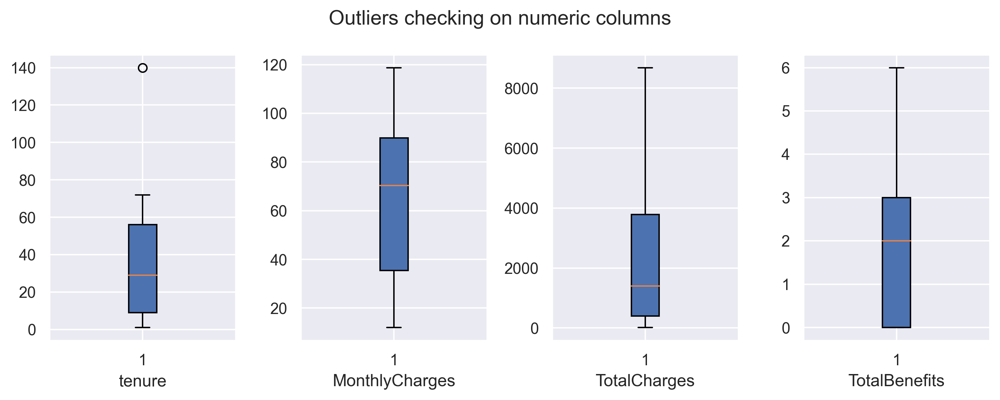

In [26]:
fig, axarr = plt.subplots(1,4, figsize=(10, 4))
for x in dfnum.columns:
    axarr[dfnum.columns.get_loc(x)].boxplot(df[x],patch_artist=True)
    axarr[dfnum.columns.get_loc(x)].set_xlabel(x)
plt.suptitle('Outliers checking on numeric columns')
fig.tight_layout(pad=1)
plt.show()

>Will drop outlier in tenure.

In [27]:
#drop outlier in tenure
df = df[df.tenure < 125]

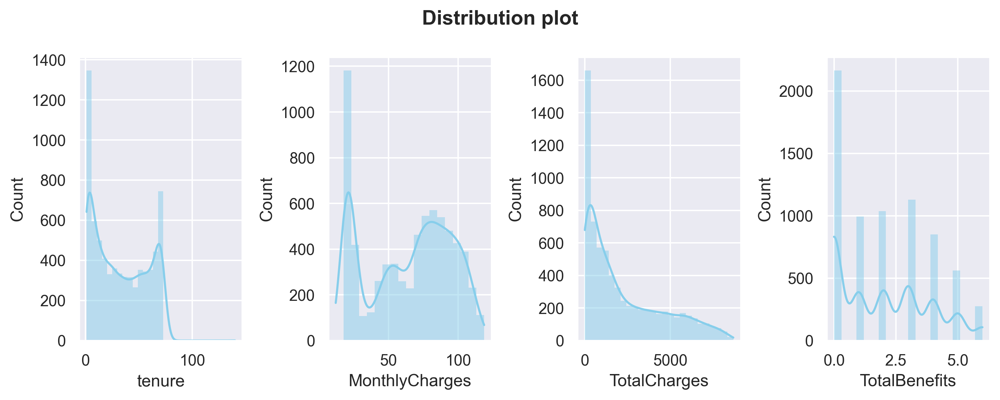

In [28]:
#plot distribution for numerical columns
fig, axarr = plt.subplots(1,4, figsize=(10, 4))
for x in dfnum.columns:
    sns.histplot(data=dfnum[x], 
                 color='skyblue', 
                 kde=True, 
                 edgecolor='none', 
                 ax=axarr[dfnum.columns.get_loc(x)])
plt.suptitle('Distribution plot', weight='bold')
fig.tight_layout(pad=1)

>Above plots are distribution plots on all numerical columns.<br>
1.tenure and MonthlyCharges have a 'U-shaped' distribution.<Br>
2.TotalCharges has a positive-skew distribution.

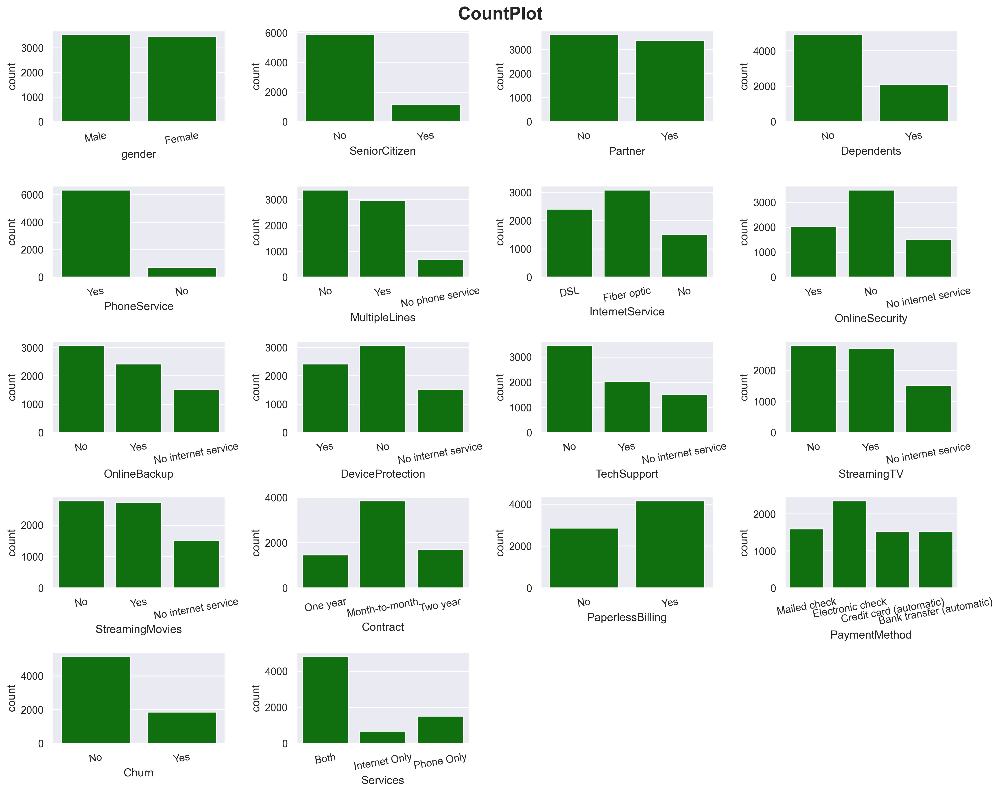

In [29]:
#count plot for categorical columns
plt.figure(figsize=(15,12))

features = dfcat.columns
for i in np.arange(1, len(features)+1):
    plt.subplot(5, len(features)//3 - 2, i)
    sns.countplot(x=df[features[i-1]], color='green')
    plt.xticks(rotation=10)
    plt.xlabel(features[i-1])
plt.suptitle('CountPlot', size=19, weight='bold')
plt.tight_layout(pad = 1)

>Here I count plotted all categorical columns.

### Multivariate Analysis

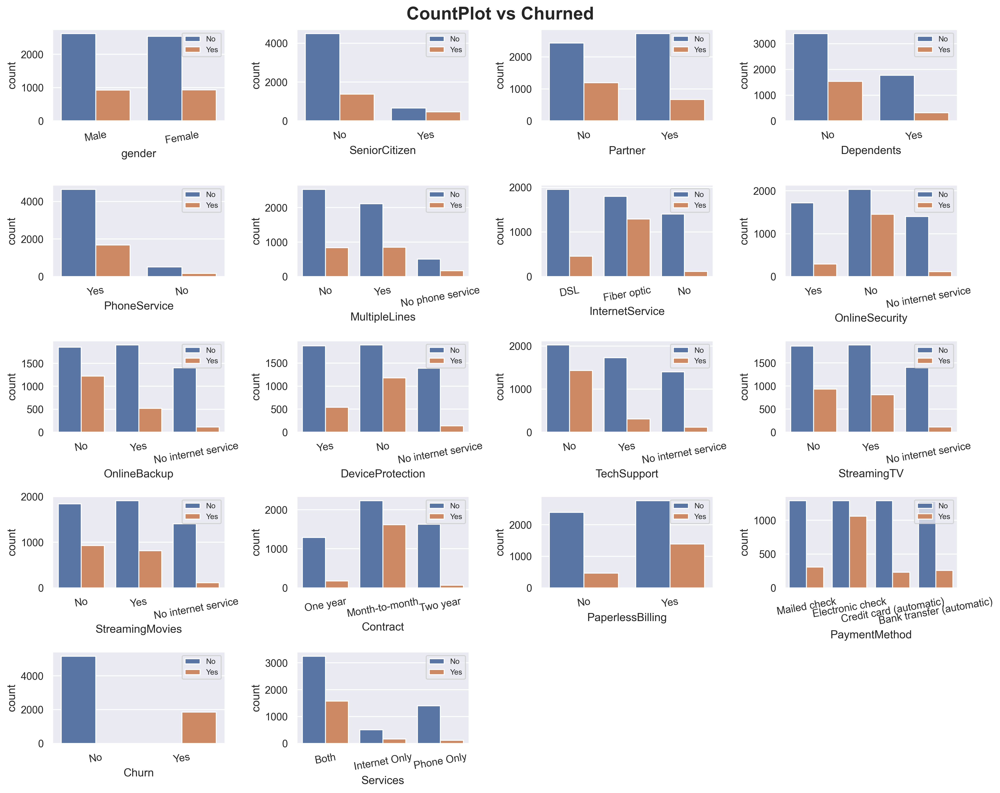

In [30]:
#count plots against 'churn'
plt.figure(figsize=(15,12))

features = dfcat.columns
for i in np.arange(1, len(features)+1):
    plt.subplot(5, len(features)//3 - 2, i)
    sns.countplot(data=df, x=df[features[i-1]], hue='Churn')
    plt.legend(prop={'size': 8})
    plt.xticks(rotation=10)
    plt.xlabel(features[i-1])
plt.suptitle('CountPlot vs Churned', size=19, weight='bold')
plt.tight_layout(pad = 1)

>I added Churn count into the categorical plots.<br>
1.You can see for column Gender, the values and Churn count is pretty equal which make this column will have a very low predictive power.<Br>
2.For InternetService, fiber optic has way higher in churn probability compare to DSL.<br>
3.Same ways also applied on Month-to-month Contract and Electronic-check PaymentMethod.   

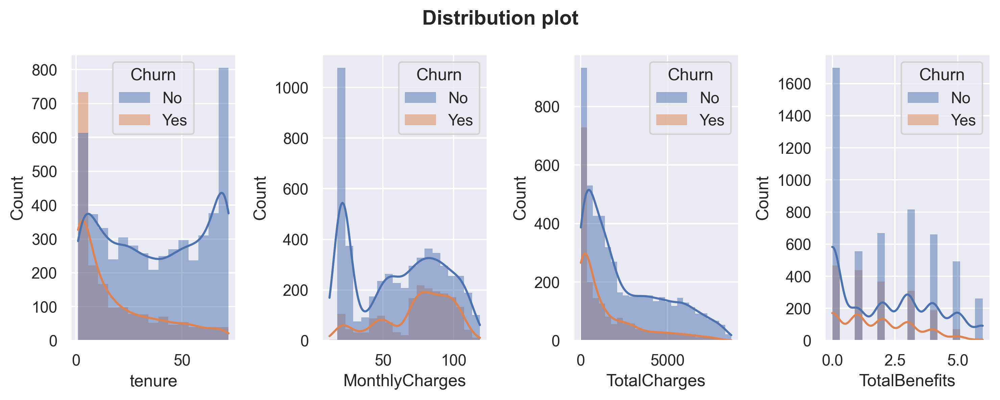

In [31]:
#distribution plots against 'churn'
fig, axarr = plt.subplots(1,4, figsize=(10, 4))
for x in dfnum.columns:
    sns.histplot(data=df, 
                 x = dfnum[x],
                 color='skyblue', 
                 kde=True, 
                 edgecolor='none', 
                 ax=axarr[dfnum.columns.get_loc(x)], 
                 hue='Churn')
    
plt.suptitle("Distribution plot", weight='bold')
fig.tight_layout(pad=1)

>Let's also compare Churn distribution on numerical columns. Customers tend to churn when the tenure is low and not churn when the MonthlyCharges is very low. I will do further analysis about these columns later.

In [32]:
#change binary column into numerical
dfcorr = df.copy()
binary = ['gender','SeniorCitizen','Partner','Dependents','PhoneService','PaperlessBilling','Churn']
value_mapping = {
    'No': 0,
    'Yes' : 1,
    'Male' : 1,
    'Female' : 0
}

for col in binary:
    dfcorr[col] = dfcorr[col].map(value_mapping).astype('int64')

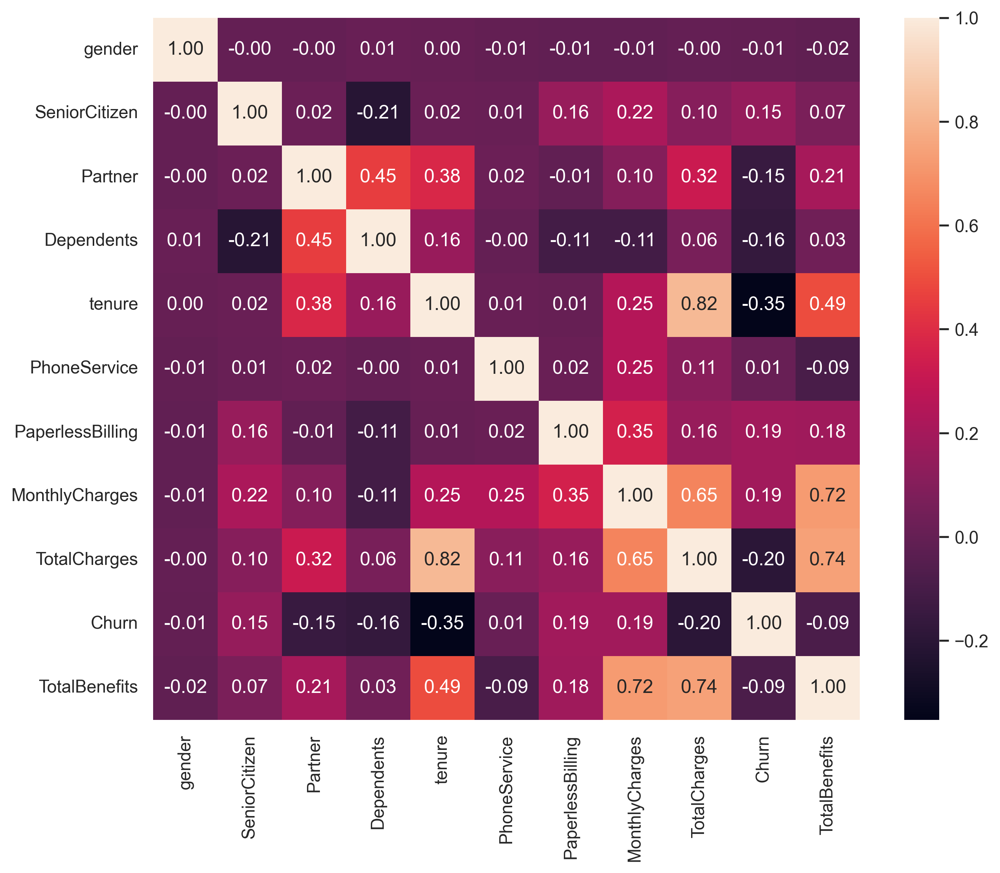

In [33]:
plt.figure(figsize=(10,8))
sns.heatmap(dfcorr.corr(), annot=True, fmt='.2f')
plt.show()

>Correlation!<br>
1.TotalCharges and tenure have a high positive correlation (causation : the longer the customers subscribed, the more they paid).<br>
2.TotalBenefits also has a strong correlation with MonthlyCharges and TotalCharges (causation : more benefits taken also make the MonthlyCharges higher).<Br>
Note : Correlation doesn't indicate causation. Understanding the specific context, industry knowledge, and conducting further analysis or experiments can help determine if there is a causal relationship between the variables or if other factors are influencing the observed correlations.

## Deep-Dive Exploratory Data Analysis
***

In [34]:
#create a function to plot churn probability for numerical columns.
def prob_plot(df,colom,x):
    means = df[colom].mean()
    medians = df[colom].median()
    data = df[df.Churn == 'Yes'][colom].astype('float64')
    data1 = df[df.Churn == 'No'][colom].astype('float64')
    
    kde = gaussian_kde(data)
    kde1 = gaussian_kde(data1)
    dist_space = np.linspace( min(data), max(data), 200)
    dist_space1 = np.linspace( min(data1), max(data1), 200)
    axarr[x].plot( dist_space, kde(dist_space), label='Churned', color='orange' )
    axarr[x].plot( dist_space1, kde1(dist_space1), label='Not churn', color='blue')
    axarr[x].axvline(x = means, linestyle = '--', color='g', label='Mean')
    axarr[x].axvline(x = medians, linestyle = '--', color='r', label='Median')
    axarr[x].set_title('Probability', fontweight='bold', size=12)
    axarr[x].set(ylabel = 'Probability', xlabel = colom)
    axarr[x].legend()

### Services & InternetService analysis

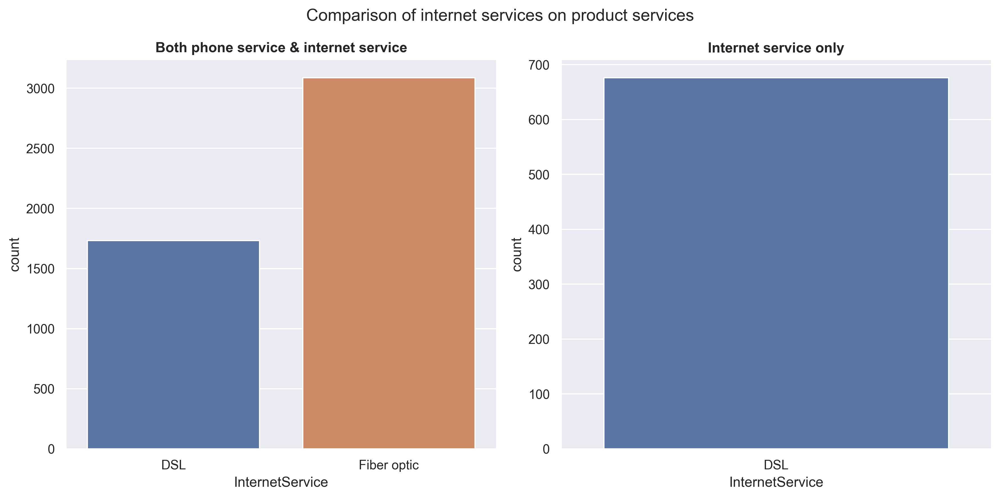

In [35]:
#count plot for Services.
fig, axarr = plt.subplots(1,2, figsize=(12, 6))
sns.countplot(data=df[df.Services == 'Both'], 
              x='InternetService', 
              ax=axarr[0])

sns.countplot(data=df[df.Services == 'Internet Only'], 
              x='InternetService', 
              ax=axarr[1])

axarr[0].set_title("Both phone service & internet service", weight='bold')
axarr[1].set_title("Internet service only", weight='bold')

plt.suptitle("Comparison of internet services on product services")
plt.tight_layout(pad=1)
plt.show()

>It is observed that customers tend to prefer Fiber optic over DSL for 'phone & internet service'. However, when considering 'internet service only' without phone, there is no option for Fiber optic available. This suggests that in order to utilize Fiber optic, a phone connection (or phone service) is required.

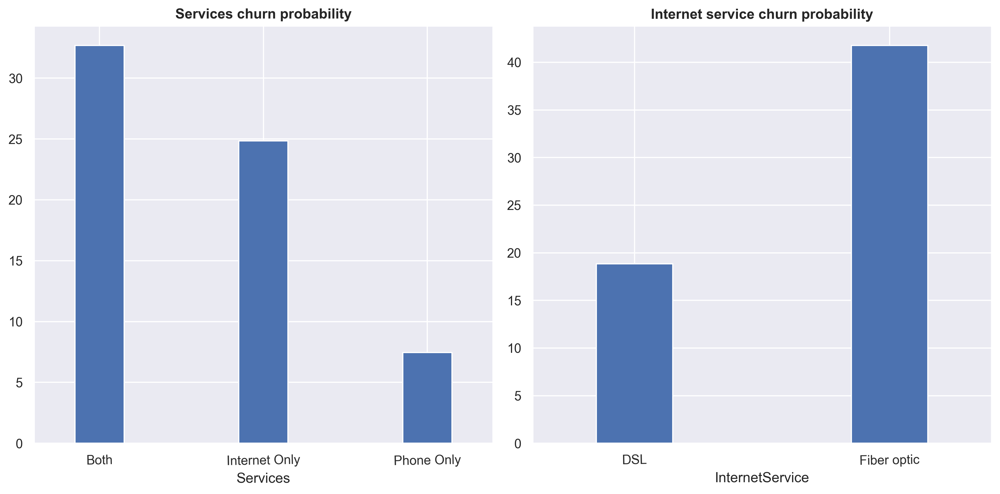

In [36]:
#plot churn probability for 'services' & 'internet services'
fig, axarr = plt.subplots(1,2, figsize=(12, 6))

df.groupby('Services')['Churn'].agg(lambda x: list(x).count('Yes') * 100 / len(list(x)))\
                               .plot(kind='bar', width=0.3,rot=True, ax=axarr[0])

df[df.Services != 'Phone Only'].groupby(['InternetService'])['Churn'].agg(lambda x: list(x).count('Yes') * 100 / len(x))\
                               .plot(kind='bar', width=0.3,rot=True, ax=axarr[1])

axarr[0].set_title('Services churn probability', weight='bold')
axarr[1].set_title('Internet service churn probability', weight='bold')

plt.tight_layout(pad=1)
plt.show()

>Customers that used 'Both' services and InternetService fiber optic tends to churn more.

### MonthlyCharges analysis

In [37]:
#checking InternetService price.
df_filtered = df[(df.Services == 'Both') & (df.TotalBenefits == 0) & (df.MultipleLines == 'No')].copy()
df_filtered.groupby('InternetService')['MonthlyCharges'].mean()

InternetService
DSL            44.963824
Fiber optic    70.083186
Name: MonthlyCharges, dtype: float64

>The price of Fiber optic is higher, around 25 USD, compared to DSL. However, it's important to keep in mind that these prices include a phone service with a single line.

In [38]:
df_filtered = df[(df.Services == 'Phone Only') & (df.TotalBenefits == 0)].copy()
df_filtered.groupby('MultipleLines')['MonthlyCharges'].mean()

MultipleLines
No     19.953819
Yes    24.973716
Name: MonthlyCharges, dtype: float64

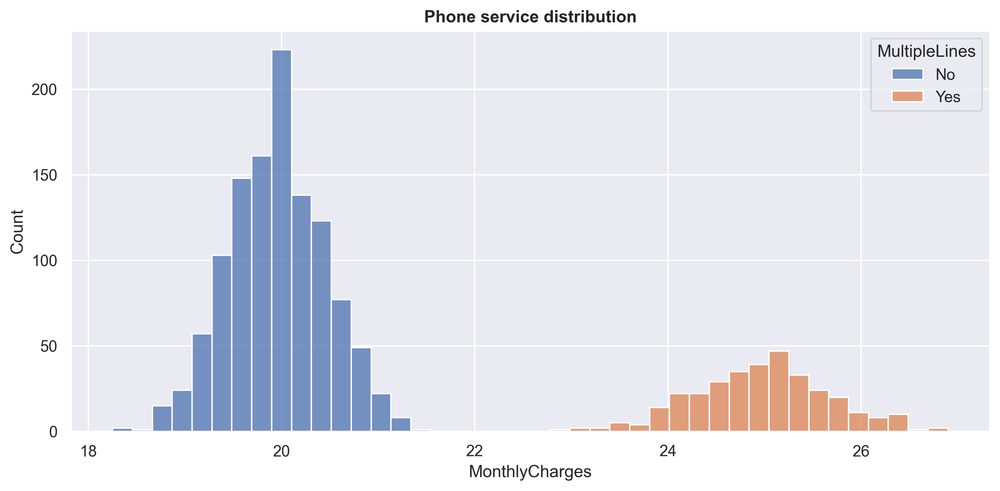

In [39]:
plt.figure(figsize=(10,5))
sns.histplot(data=df_filtered, 
             x='MonthlyCharges', 
             hue='MultipleLines', 
             multiple='stack')

plt.title('Phone service distribution', weight='bold')
plt.tight_layout()
plt.show()

>We can see that the price for a 'phone service' with a single line is around 20 USD, while the price for a 'phone service' with multiple lines is around 25 USD. This also means that the price for DSL is around 25 USD, while the price for Fiber optic is around 50 USD, which is twice as much as DSL.

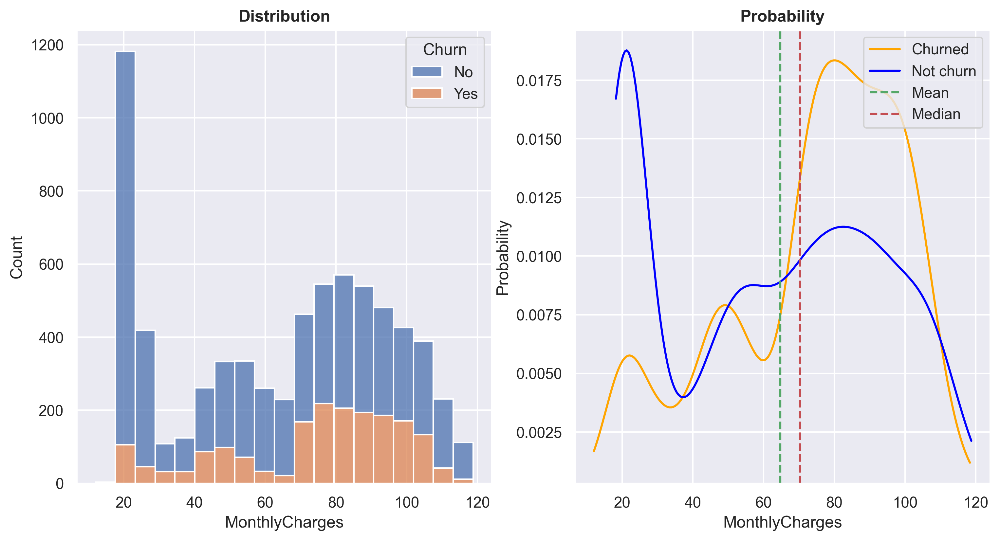

In [40]:
fig, axarr = plt.subplots(1,2, figsize=(12, 6))
mc_dist = sns.histplot(data=df, 
                       x = 'MonthlyCharges',
                       hue='Churn', 
                       ax=axarr[0], 
                       multiple='stack')

axarr[0].set_title('Distribution', fontweight='bold', size=12)

prob_plot(df,'MonthlyCharges',1)
axarr[1].legend(loc='upper right')
plt.show()

>At a MonthlyCharges range of approximately +- 20 USD, the ratio of non-churn customers is very high. It is known that products within this price range are typically 'phone service only'. However, between the price range of 60 - 100 USD, the churn probability increases significantly. I am planning to conduct further analysis specifically for customers within this price range.

In [41]:
df_filtered = df[(df.InternetService == 'Fiber optic') & (df.Services == 'Both') & (df.MultipleLines == 'No')]
df_agg = df_filtered.groupby('TotalBenefits')['MonthlyCharges'].agg('mean').reset_index()
df_agg['MonthlyCharges'] = df_agg.MonthlyCharges.round()

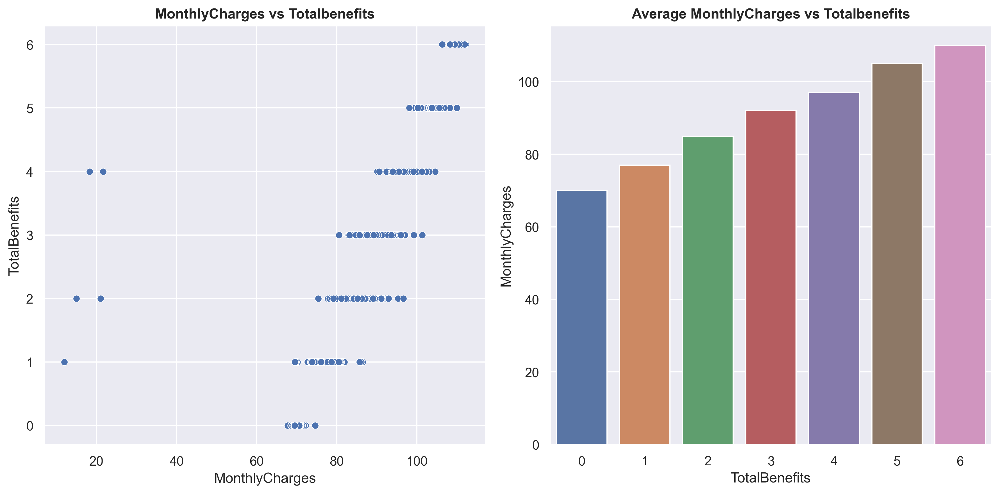

In [42]:
fig, axarr = plt.subplots(1,2, figsize=(12, 6))
sns.scatterplot(data=df_filtered, 
                x='MonthlyCharges', 
                y='TotalBenefits', 
                s=35, 
                ax=axarr[0])

sns.barplot(df_agg, x = 'TotalBenefits', y = 'MonthlyCharges')
axarr[0].set_title('MonthlyCharges vs Totalbenefits', weight='bold')
axarr[1].set_title('Average MonthlyCharges vs Totalbenefits', weight='bold')
fig.tight_layout(pad = 1)
plt.show()

>Here, you can observe that as more TotalBenefits are taken, the MonthlyCharges also increase. On the left plot, you can see that there are 5 outlier data points, which will be removed later.

In [43]:
df_fil = df[(df.InternetService == 'Fiber optic') & (df.Services == 'Both')\
              & (df.MultipleLines == 'No') & (df.TotalBenefits == 1)]

benefits = ['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']

df_benefit = pd.DataFrame()
for x in benefits:
    df_value = pd.DataFrame([x, 
                      df_fil[df_fil[x] == 'Yes']['MonthlyCharges'].min(), 
                      df_fil[df_fil[x] == 'Yes']['MonthlyCharges'].max(), 
                      df_fil[df_fil[x] == 'Yes']['MonthlyCharges'].mean(), 
                      df_fil[df_fil[x] == 'Yes']['MonthlyCharges'].median()
                     ]).transpose()
    
    df_benefit = pd.concat([df_benefit, df_value])
df_benefit.columns = ['Benefit','MinCharges','MaxCharges','MeanCharges','MedianCharges']    

In [44]:
df_benefit

,Benefit,MinCharges,MaxCharges,MeanCharges,MedianCharges
0,OnlineSecurity,73.2,80.3,74.952857,75.0
0,OnlineBackup,72.75,76.65,74.708511,74.65
0,DeviceProtection,69.55,76.65,74.258889,74.8
0,TechSupport,73.85,76.55,75.045455,74.7
0,StreamingTV,77.65,81.9,79.746825,79.75
0,StreamingMovies,12.0,86.45,79.16746,80.0


>Above are the prices of benefits with Fiber optic and a single line phone connection. You can see that StreamingTV and StreamingMovies are more expensive compared to other benefits, approximately +- 5 USD.

Now that we know the prices of every product, here's a recap:<br>

DSL = approximately 25 USD.<br>
Fiber optic = approximately 50 USD.<br>
Phone service (single line) = approximately 20 USD.<br>
Phone service (multiple lines) = approximately 25 USD.<br>
OnlineSecurity - TechSupport = approximately 5 USD.<br>
StreamingTV - StreamingMovies = approximately 10 USD.<br>

With this data, we can perform a simple 'anomaly detection' by manually calculating the MonthlyCharges and comparing them with the actual MonthlyCharges, similar to how we calculated the TotalChargesDiff above.

In [45]:
#checking for MonthlyCharges values with the calculated one (similar with checking TotalCharges difference).
def MonthlyChargesDiff(x):
    estimation = 0
    if x['PhoneService'] == 'Yes':
        estimation += 20
    if x['MultipleLines'] == 'Yes':
        estimation += 5
    if x['InternetService'] == 'DSL':
        estimation += 25
    if x['InternetService'] == 'Fiber optic':
        estimation += 50
        
    if (x['StreamingTV'] == 'Yes') & (x['StreamingMovies'] == 'Yes'):
        estimation += 20 + (x['TotalBenefits'] - 2) * 5
    elif (x['StreamingTV'] == 'Yes') | (x['StreamingMovies'] == 'Yes'):
        estimation += 10 + (x['TotalBenefits'] - 1) * 5
    else:
        estimation += x['TotalBenefits'] * 5
        
    return abs(1 - (estimation / x['MonthlyCharges'])) * 100
    
   

In [46]:
df['MonthlyChargesEstimationDifference'] = df.apply(MonthlyChargesDiff, axis=1)

In [47]:
df[df.MonthlyChargesEstimationDifference > 40][['MonthlyCharges','MonthlyChargesEstimationDifference']]

,MonthlyCharges,MonthlyChargesEstimationDifference
12,29.00,296.551724
389,12.00,733.333333
666,12.00,566.666667
859,26.41,278.644453
1439,18.26,447.645126
2185,21.63,362.320851
4090,31.26,219.897633
5848,15.00,466.666667
6718,21.00,304.761905


>You can see that there are 9 rows with extreme MonthlyCharges values. These are considered as 'anomalies', so let's remove them.

In [48]:
#remove MonthlyCharges extreme values.
df = df[df.MonthlyChargesEstimationDifference < 40].reset_index(drop=True)

### Customer analysis

In [49]:
#creating a function to engineered a new feature.
def statuss(x):
    x = list(x)
    if (x[0] == 'Yes') & (x[1] == 'Yes'):
        return 'Both'
    elif (x[0] == 'Yes') & (x[1] == 'No'):
        return 'Partner Only'
    elif (x[0] == 'No') & (x[1] == 'Yes'):
        return 'Dependent Only'
    else:
        return 'Single'

In [50]:
df['Status'] = df[['Partner','Dependents']].apply(statuss, axis=1)

>I have created a new feature called 'Status'. This feature is derived from the columns Partner and Dependents.<br><br>
1.If customers have both Partner and Dependents, it will be labeled as 'Both'.<br>
2.If customers have Partner but no Dependents, it will be labeled as 'Partner Only'.<br>
3.If customers have Dependents but no Partner, it will be labeled as 'Dependent Only'.<br>
4.If customers have neither Partner nor Dependents, it will be labeled as 'Single'.<br>

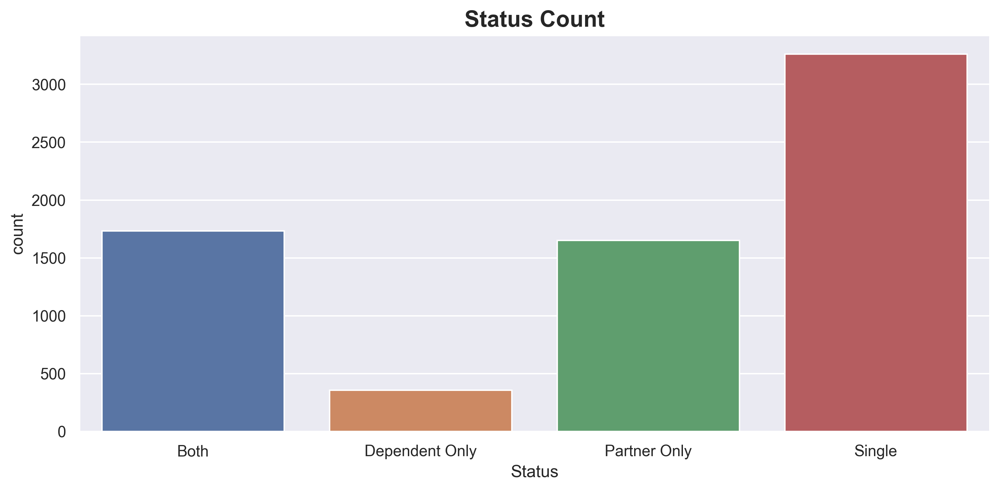

In [51]:
plt.figure(figsize=(10,5))
sns.countplot(df.sort_values('Status', ascending=True), x='Status')
plt.title('Status Count', size=16, weight='bold')
plt.tight_layout()
plt.show()

>Majority of customers are Single.

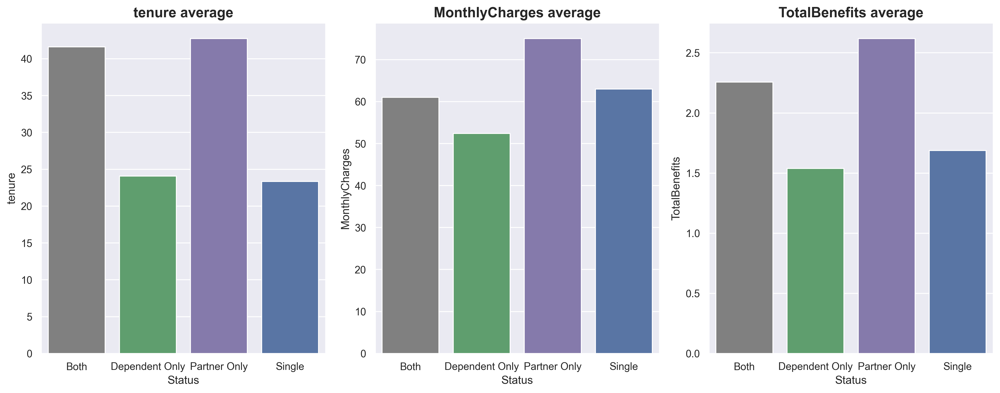

In [52]:
fig, axarr = plt.subplots(1,3, figsize=(15, 6))
k = ['tenure','MonthlyCharges','TotalBenefits']
for x in k:
    sns.barplot(data=df.groupby(['Status'])[[x]].mean().reset_index(), 
                x='Status', 
                y=x, 
                ax=axarr[k.index(x)],
                palette=['grey', 'g','m','b'])
    
    axarr[k.index(x)].set_title(f'{x} average', weight='bold', size=15)
    
fig.tight_layout()
plt.show()

>Customers labeled as 'Partner Only' are considered the best since they have the longest tenure and the highest MonthlyCharges. The second-best group is 'Both', although these customers may not have MonthlyCharges as high as those in the 'Single' group, their tenure is almost double that of the 'Single' group.

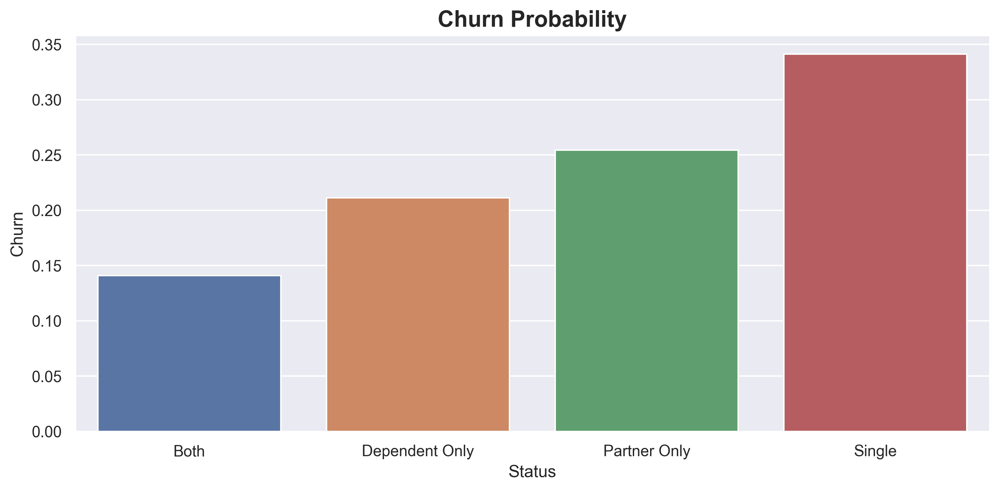

In [53]:
plt.figure(figsize=(10,5))
sns.barplot(data=df.groupby('Status')[['Churn']].agg(lambda x: list(x).count('Yes') / len(x)).reset_index(), 
            x='Status', 
            y='Churn')

plt.title('Churn Probability', weight='bold', size=16)
plt.tight_layout()
plt.show()

>Single customers have the highest churn probability.

In [54]:
df.SeniorCitizen.value_counts(normalize=True)


No     0.837903
Yes    0.162097
Name: SeniorCitizen, dtype: float64

>The majority of customers are young people.

In [55]:
df_status = df.groupby('SeniorCitizen')[['Status']]
df_status = df_status.agg(Single = ('Status', lambda x: list(x).count('Single') * 100 / len(x)), 
                          PartnerOnly = ('Status', lambda x: list(x).count('Partner Only') * 100  / len(x)), 
                          Both = ('Status', lambda x: list(x).count('Both') * 100  / len(x)), 
                          DependentOnly = ('Status', lambda x: list(x).count('Dependent Only') * 100  / len(x)))
df_status = df_status.reset_index().melt(id_vars='SeniorCitizen')
df_status = df_status.rename(columns={'variable':'Status'})

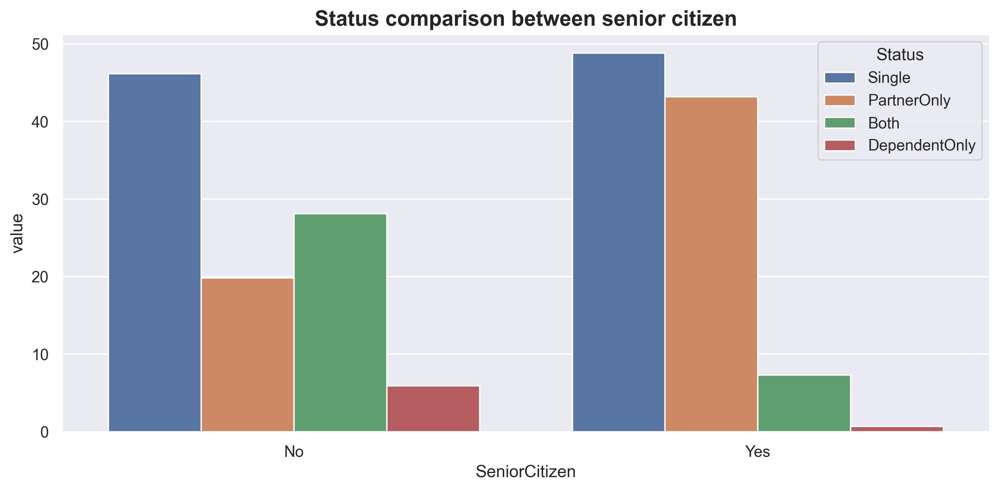

In [56]:
plt.figure(figsize=(10,5))

sns.barplot(data=df_status, 
            x ='SeniorCitizen', 
            y='value', 
            hue='Status')

plt.title("Status comparison between senior citizen", size=15, weight='bold')
plt.tight_layout()
plt.show()

>For non-Senior citizens, 'Single' customers have the highest frequency, followed by 'Both'. For Senior citizens, 'Single' is also the highest category, but the difference with 'PartnerOnly' is not as significant. From the plots above, we can also conclude that young people tend to have dependents more than older people.

In [57]:
df_status = df.groupby('Status')[['OnlineSecurity','OnlineBackup',
                                  'DeviceProtection','TechSupport','StreamingTV','StreamingMovies']]\
                                  .agg(lambda x: list(x).count('Yes'))
    
df_status['total'] = df_status.apply('sum',axis=1)

for x in df_status.drop(columns='total').columns:
    df_status[x] = (df_status[x] * 100 / df_status.total).round()
df_status.drop(columns='total', inplace=True)

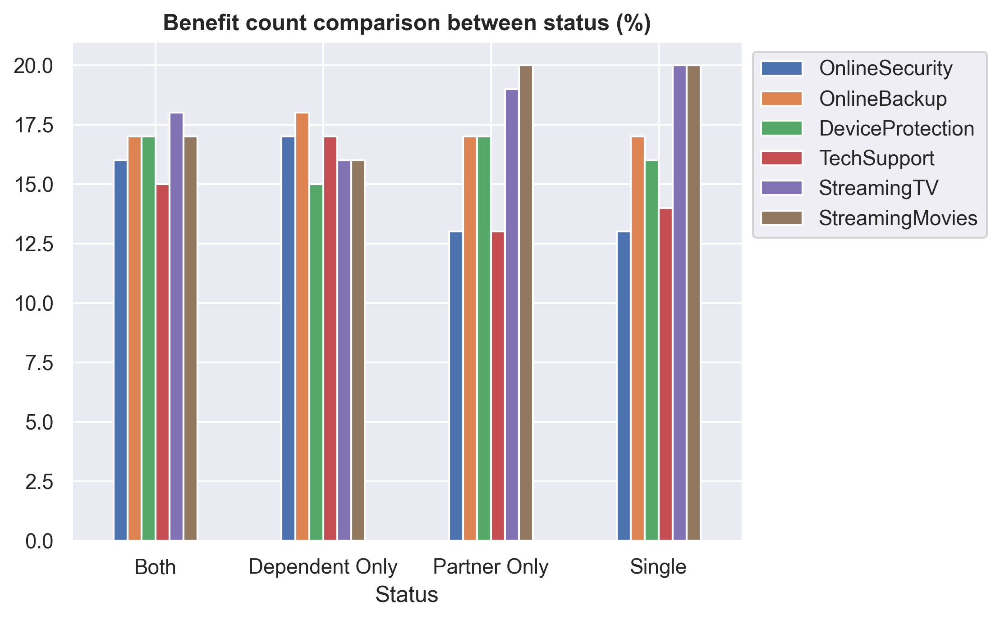

In [58]:
df_status.plot(kind='bar', rot=0)
plt.title('Benefit count comparison between status (%)', size=12, weight='bold')
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

>Single and PartnerOnly customers tend to prefer entertainment benefits such as StreamingTV and StreamingMovies compared to other customers. Additionally, these customers show a lower preference for using TechSupport and OnlineSecurity.

### Benefits analysis

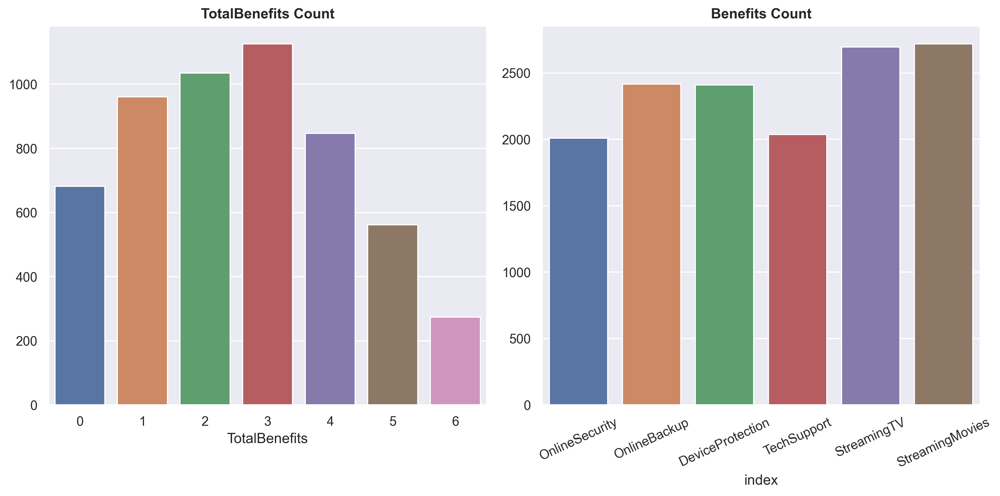

In [59]:
fig, axarr = plt.subplots(1,2, figsize=(12, 6))
sns.countplot(df[df.Services != 'Phone Only'], 
              x = 'TotalBenefits', ax=axarr[0])

sns.barplot(df[['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']]\
            .apply(lambda x: list(x).count('Yes')).reset_index(), x = 'index', y = 0, ax=axarr[1])

axarr[0].set_title('TotalBenefits Count', size=12, weight='bold')
axarr[0].set(ylabel=None)

axarr[1].set(ylabel=None)
axarr[1].set_title('Benefits Count', size=12, weight='bold')
axarr[1].tick_params(axis='x', rotation=25)
fig.tight_layout()
plt.show()

>The average number of TotalBenefits taken by customers is around 3, with StreamingTV and StreamingMovies being the most popular choices.

In [60]:
df_total = pd.DataFrame()
for x in ['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']:
    total = list(df[df[x] == 'Yes']['Churn']).count('Yes') / len(df[df[x] == 'Yes']['Churn'])
    df_total = pd.concat([df_total, pd.DataFrame([x],[total])])

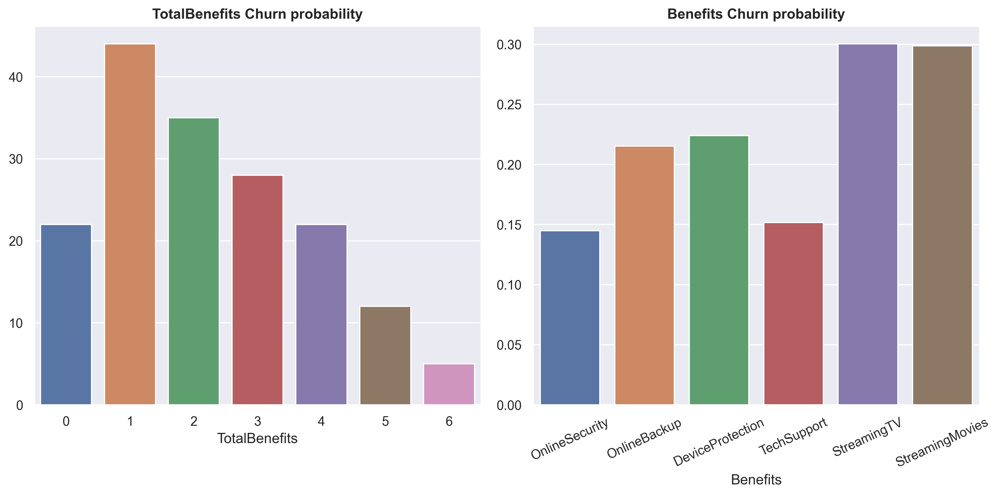

In [61]:
fig, axarr = plt.subplots(1,2, figsize=(12, 6))
sns.barplot(df.groupby('TotalBenefits')[['Churn']]\
            .agg(lambda x: list(x).count('Yes') * 100 / len(x)).round().reset_index(), 
            x='TotalBenefits', 
            y='Churn', ax=axarr[0])

sns.barplot(df_total.reset_index(), 
            x=0, 
            y='index', 
            ax=axarr[1])

axarr[0].set_title('TotalBenefits Churn probability', size=12, weight='bold')
axarr[0].set(ylabel=None)

axarr[1].set(ylabel=None, xlabel='Benefits')
axarr[1].set_title('Benefits Churn probability', size=12, weight='bold')
axarr[1].tick_params(axis='x', rotation=25)
fig.tight_layout()
plt.show()

>While StreamingTV and StreamingMovies are the most favored choices, the churn probability associated with them is also the highest.

### Churn analysis

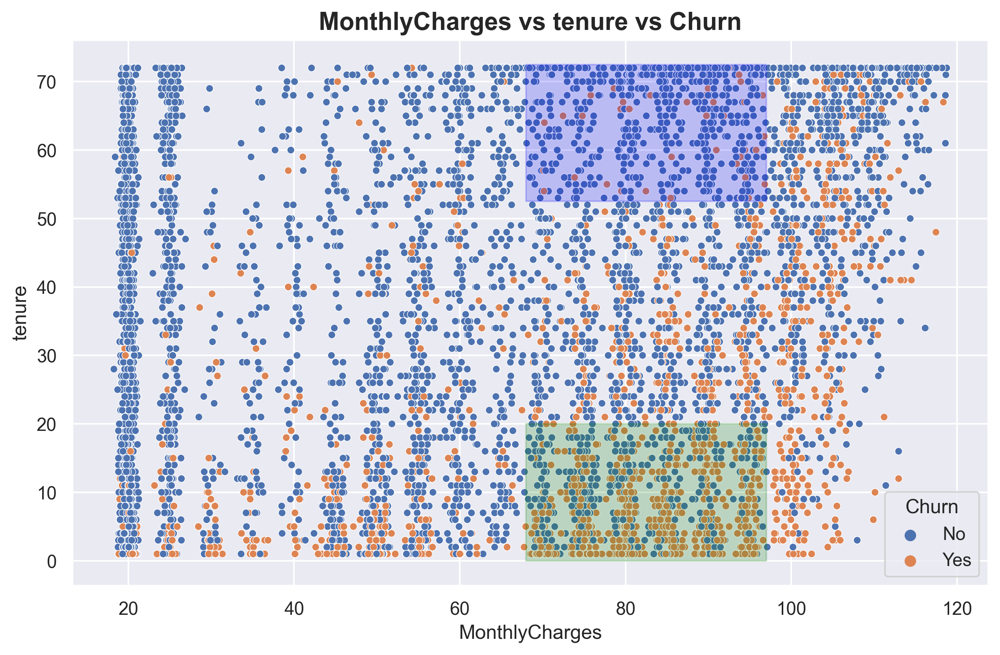

In [62]:
fig, axarr = plt.subplots(1, figsize=(10, 6))
sns.scatterplot(data=df, 
                x = 'MonthlyCharges', 
                y = 'tenure', 
                hue ='Churn', 
                s=20)

plt.fill_between((68 , 97),20, alpha=0.2, color='green')
plt.fill_between((68 , 97),52.5, 72.5, alpha=0.2, color='blue')

plt.title('MonthlyCharges vs tenure vs Churn', size = 15, weight = 'bold')
plt.show()

>Here, I have created two areas, denoted by green and blue, both focusing on MonthlyCharges in the range of 70 - 95 USD. This price range corresponds to the highest churn probability. The green area represents customers with low tenure and is predominantly occupied by churned customers, while the blue area represents customers with high tenure and is predominantly occupied by non-churned customers.

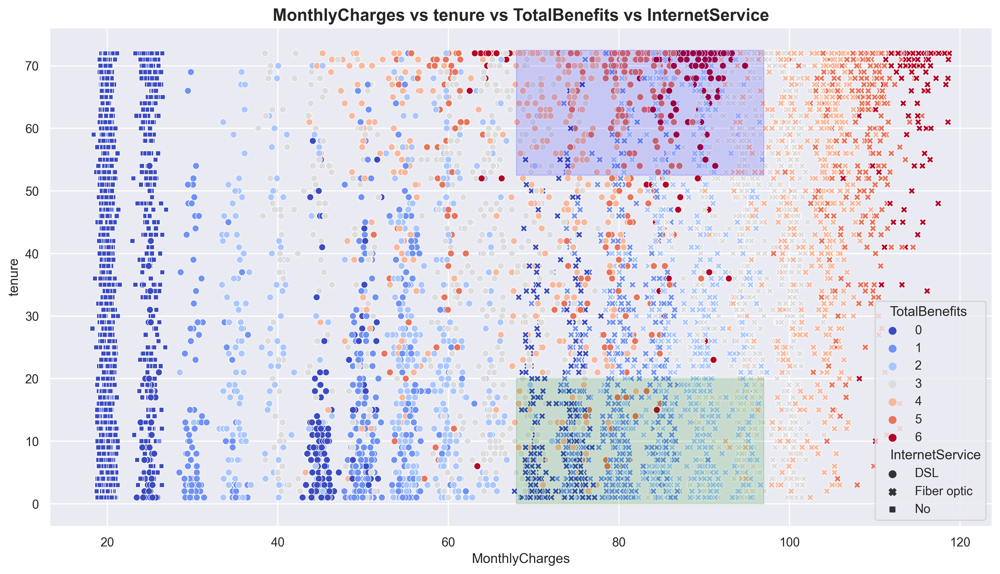

In [63]:
plt.subplots(1, figsize=(15, 8))
sns.scatterplot(data=df, 
                x = 'MonthlyCharges', 
                y = 'tenure', 
                s=35, 
                hue='TotalBenefits', 
                style='InternetService', 
                palette='coolwarm')

plt.fill_between((68 , 97),20, alpha=0.15, color='green')
plt.fill_between((68 , 97),52.5, 72.5, alpha=0.15, color='blue')

plt.title('MonthlyCharges vs tenure vs TotalBenefits vs InternetService', size = 15, weight = 'bold')
plt.show()

>Still on the same plot, I have added TotalBenefits and InternetService. It can be observed that in the green area, Fiber optic is the dominant InternetService with low TotalBenefits. On the other hand, the blue area is dominated by DSL with high TotalBenefits. This indicates that customers, at the same price point, tend to choose DSL with high TotalBenefits rather than Fiber optic with low TotalBenefits. Note that Fiber optic prices are doubled than DSL.

With the observed pattern above, we can create an important new feature, which we will refer to as 'FO_LB' (Fiber optic_Low benefit). I will assign a value of '1' to indicate that the internet service is Fiber optic and the Totalbenefits taken are less than or equal to 3. For other cases, I will assign '0'.

In [64]:
df['FO_LB'] = df[['InternetService','TotalBenefits']].apply(
    lambda x: 1 if (x['InternetService'] == 'Fiber optic') & (x['TotalBenefits'] <= 3) else 0, axis=1)

## Modelling
***
One important thing to address before we proceed is considering the types of errors to make this project as realistic as possible. Typically, there are two types of errors: false positive (FP) and false negative (FN). However, in this project, I will introduce three types of errors.<br>

1.FP: False positive <br>
2.FN1: False negative for customers with MonthlyCharges below 95 USD <br>
3.FN2: False negative for customers with MonthlyCharges above 95 USD (VIP customers) <br>
Let's agree on the misclassification ratio, which is FP:FN1:FN2 = 1:3:5 <br>

It's important to note that this dataset is imbalanced, meaning there is a significant difference in the number of samples between the classes.

Based on these problems, we can set up our model's parameters as follows:<Br><br>
1.Hyperparameter tuning.<Br>
2.Decision threshold tuning.<Br>
3.Oversampling data using SMOTE.<Br>
4.Applying weights to the models.<Br>
I will be using Random Forest, XGBoost, and Logistic Regression.
                                                             

    


Metrics:<br>
Custom scoring based on sample misclassification.<br>
Precision.<br>
Recall.<br>
F1_score.<br>
Once the models are evaluated using these metrics, I will interpret the best model.

### Feature selection & encoding

In [65]:
df1 = df.copy()

In [66]:
df = df1.copy()

In [67]:
#drop columns
df.drop(columns = ['Services','MonthlyChargesEstimationDifference','Status','PaperlessBilling','PaymentMethod'], inplace=True)

>I have dropped the columns from 'Services' to 'Status' as these columns were engineered features created for simpler exploratory data analysis (EDA). Additionally, I have also dropped the 'PaperlessBilling' and 'PaymentMethod' columns because, in the business context, these columns are considered irrelevant for determining customer churn since they represent optional 'features' for customers.

In [68]:
#converting 'No internet service' to 'No' in benefit columns.
KolomBenefit = ['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']

for x in KolomBenefit:
    df[x] = df[x].apply(lambda x: 'No' if x == 'No internet service' else x)

In [69]:
#converting 'No phone service' to 'No'
df['MultipleLines'] = df[x].apply(lambda x: 'No' if x == 'No phone service' else x)

In [70]:
#dict to mapping string to numerical.
value_mapping = {
    'No': 0,
    'Yes' : 1,
    'Male' : 1,
    'Female' : 0
}

In [71]:
#binary encoding
binary = list(df.drop(columns=['tenure','InternetService','MonthlyCharges','TotalCharges','TotalBenefits','Contract','FO_LB']).columns)

for col in binary:
    df[col] = df[col].map(value_mapping).astype('int64')

In [72]:
#label encoding
df['Contract'] = df['Contract'].apply(lambda x: 1 if x == 'Month-to-month' else 2 if x == 'One year' else 3) 

In [73]:
#one hot encoding
df = pd.get_dummies(df, columns=['InternetService'])

In [74]:
#feature selection
df = df[['Contract','tenure','InternetService_Fiber optic','MonthlyCharges','FO_LB','InternetService_No','Churn']]
df = df.rename(columns={
                'InternetService_Fiber optic':'Fiber_optic',
                'InternetService_No':'No_internet'})

>Here I only choose a feature that have a strong predictive power (by using feature of importances)

### Splits data and define custom function

In [75]:
#split train-test
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns='Churn'), df.Churn.to_numpy(), test_size = 0.2, random_state=123)
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

In [76]:
#custom function to do threshold tuning and custom metrics (used in GridSearchCV)
def my_scorer_2(clf, X, y_true, thres = np.arange(0.1,1,0.1)):
    result_dict = {}
    for threshold in np.atleast_1d(thres):
        y_pred = (clf.predict_proba(X)[:,1] > threshold).astype(int)
        X_segment = (X['MonthlyCharges'] > 95).to_numpy().astype(int)
        y_stack = np.column_stack((X_segment, y_pred, y_true))
        y_stack_reg, y_stack_vip = y_stack[y_stack[:,0] == 0], y_stack[y_stack[:,0] == 1]
        cm_reg = confusion_matrix(y_stack_reg[:,2], y_stack_reg[:,1])
        cm_vip = confusion_matrix(y_stack_vip[:,2], y_stack_vip[:,1])
        fn_reg, fn_vip = cm_reg[1][0], cm_vip[1][0]
        fp = cm_reg[0][1] + cm_vip[0][1]
        loss_score = (fp * 1) + (fn_reg * 3) + (fn_vip * 5)
        result_dict[threshold] = np.array([loss_score, metrics.precision_score(y_true, y_pred, zero_division = 0), 
                                           metrics.recall_score(y_true, y_pred), metrics.f1_score(y_true, y_pred)])
        
    result_np = np.array([np.insert(value, 0, key) for key, value in result_dict.items()])
    best_np = result_np[result_np[:,1] == np.min(result_np[:,1])][0]
    return best_np

def my_scorer_threshold(clf, X, y_true):
    return my_scorer_2(clf, X, y_true)[0]

def my_scorer_ls(clf, X, y_true):
    return my_scorer_2(clf, X, y_true)[1]

def my_scorer_precision(clf, X, y_true):
    return my_scorer_2(clf, X, y_true)[2]

def my_scorer_recall(clf, X, y_true):
    return my_scorer_2(clf, X, y_true)[3]

def my_scorer_f1(clf, X, y_true):
    return my_scorer_2(clf, X, y_true)[4]
        
        

In [77]:
#Grid scoring parameter
grid_scoring = {
    'threshold': my_scorer_threshold,
    'loss_score': my_scorer_ls,
    'precision': my_scorer_precision,
    'recall': my_scorer_recall,
    'f1': my_scorer_f1
}

In [78]:
#define weight by missclassification cost which is FP:FN1:FN2 = 1:3:5
X_segment = (X_train['MonthlyCharges'] > 95).to_numpy().astype(int)
arr_weight = np.column_stack((X_segment, y_train))
weight = np.apply_along_axis(lambda x: 1 if x[1] == 0 else 5 if x[0] == 1 else 3 , axis=1, arr=arr_weight)

### Model building 1 / Hyperparameter tuning + threshold tuning

In [79]:
#RANDOM FOREST MODELLING

#define parameter for tuning
param_grid_rf = {
    'n_estimators': [250 , 400],
    'max_depth': [10, 25, 50],
    'min_samples_split': [25, 50, 70, 120],
    'min_samples_leaf': [50, 75, 120],
    'bootstrap' : [True, False]
}

#run grid search cv
rf = GridSearchCV(estimator = RandomForestClassifier(),
                  param_grid = param_grid_rf,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
rf.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(rf.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
rf = RandomForestClassifier(**grid_result.iloc[0,0])

#train model with train data
rf = rf.fit(X_train, y_train)

#evaluate the model
mb1_rf = my_scorer_2(rf, X_test, y_test, grid_result.iloc[0,1])
mb1_rf = np.append(mb1_rf, grid_result.iloc[0,0])

In [80]:
#XGBOOST MODELLING

#define parameter for tuning
param_grid_xg = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500],
    'max_depth': [5, 10, 25],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

#run grid search cv
xg = GridSearchCV(estimator = XGBClassifier(),
                  param_grid = param_grid_xg,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
xg.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(xg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
xg = XGBClassifier(**grid_result.iloc[0,0])

#train model with train data
xg = xg.fit(X_train, y_train)

#evaluate the model
mb1_xg = my_scorer_2(xg, X_test, y_test, grid_result.iloc[0,1])
mb1_xg = np.append(mb1_xg, grid_result.iloc[0,0])


In [81]:
#LOGISTIC REGRESSION MODELLING

#define parameter for tuning
param_grid_lg = {
    'penalty': ['l1', 'l2'], 
    'C': [0.1, 1.0, 10.0],  
    'solver': ['liblinear'],  
    'max_iter': [50,100,200] 
}

#run grid search cv
lg = GridSearchCV(estimator = LogisticRegression(),
                  param_grid = param_grid_lg,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
lg.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(lg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
lg = LogisticRegression(**grid_result.iloc[0,0])

#train model with train data
lg = lg.fit(X_train, y_train)

#evaluate the model
mb1_lg = my_scorer_2(lg, X_test, y_test, grid_result.iloc[0,1])
mb1_lg = np.append(mb1_lg, grid_result.iloc[0,0])

In [82]:
result_mb1 = pd.DataFrame([mb1_rf,mb1_xg,mb1_lg])
result_mb1.columns = ['threshold','score','precision','recall','f1','params']
result_mb1['model'] = ['MB1_RF','MB1_XG','MB1_Log_Reg']
result_mb1

,threshold,score,precision,recall,f1,params,model
0,0.24,539.0,0.473101,0.828255,0.602216,"{'bootstrap': True, 'max_depth': 25, 'min_samp...",MB1_RF
1,0.20,558.0,0.449190,0.844875,0.586538,"{'colsample_bytree': 0.8, 'learning_rate': 0.0...",MB1_XG
2,0.22,541.0,0.467492,0.836565,0.599801,"{'C': 0.1, 'max_iter': 50, 'penalty': 'l2', 's...",MB1_Log_Reg


### Model building 2 / Hyperparameter tuning + threshold tuning + SMOTE

In [83]:
#RANDOM FOREST MODELLING

#define parameter for tuning
param_grid_rf_smote = {
    'class__n_estimators': [250 , 400],
    'class__max_depth': [10, 25, 50],
    'class__min_samples_split': [25, 50, 70, 120],
    'class__min_samples_leaf': [50, 75, 120],
    'class__bootstrap' : [True, False]
}

#create imbalanced pipeline to SMOTE 
pipelinerf = Pipeline([
        ('sampling', SMOTE()),
        ('class', RandomForestClassifier())])

#run grid search cv
rf = GridSearchCV(estimator = pipelinerf,
                  param_grid = param_grid_rf_smote,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
rf.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(rf.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]
params = grid_result.iloc[0,0]

params_update = {}
for key, value in params.items():
    new_key = key.replace('class__', '')
    params_update[new_key] = value
params = params_update
    
#train model with the best hyperparameter
rf = RandomForestClassifier(**params)

#train model with SMOTE train data
X_train1, y_train1 = SMOTE().fit_resample(X_train, y_train)
rf = rf.fit(X_train1, y_train1)

#evaluate the model
mb2_rf = my_scorer_2(rf, X_test, y_test, grid_result.iloc[0,1])
mb2_rf = np.append(mb2_rf, params)

In [84]:
#XGBOOST MODELLING

#define parameter for tuning
param_grid_xg_smote = {
    'class__learning_rate': [0.1, 0.01, 0.001],
    'class__n_estimators': [100, 500],
    'class__max_depth': [5, 10, 25],
    'class__subsample': [0.8, 0.9, 1.0],
    'class__colsample_bytree': [0.8, 0.9, 1.0]
}

#create imbalanced pipeline to SMOTE 
pipelinexg = Pipeline([
        ('sampling', SMOTE()),
        ('class', XGBClassifier())])

#run grid search cv
xg = GridSearchCV(estimator = pipelinexg,
                  param_grid = param_grid_xg_smote,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
xg.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(xg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]
params = grid_result.iloc[0,0]

params_update = {}
for key, value in params.items():
    new_key = key.replace('class__', '')
    params_update[new_key] = value
params = params_update
    
#train model with the best hyperparameter
xg = XGBClassifier(**params)

#train model with SMOTE train data
X_train1, y_train1 = SMOTE().fit_resample(X_train, y_train)
xg = xg.fit(X_train1, y_train1)

#evaluate the model
mb2_xg = my_scorer_2(xg, X_test, y_test, grid_result.iloc[0,1])
mb2_xg = np.append(mb2_xg, params)

In [85]:
#LOGISTIC REGRESSION MODELLING

#define parameter for tuning
param_grid_lg_smote = {
    'class__penalty': ['l1', 'l2'], 
    'class__C': [0.1, 1.0, 10.0],  
    'class__solver': ['liblinear'],  
    'class__max_iter': [50,100,200] 
}


#create imbalanced pipeline to SMOTE 
pipelinelg = Pipeline([
        ('sampling', SMOTE()),
        ('class', LogisticRegression())])

#run grid search cv
lg = GridSearchCV(estimator = pipelinelg,
                  param_grid = param_grid_lg_smote,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
lg.fit(X_train, y_train)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(lg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]
params = grid_result.iloc[0,0]

params_update = {}
for key, value in params.items():
    new_key = key.replace('class__', '')
    params_update[new_key] = value
params = params_update
    
#train model with the best hyperparameter
lg = LogisticRegression(**params)

#train model with SMOTE train data
X_train1, y_train1 = SMOTE().fit_resample(X_train, y_train)
lg = lg.fit(X_train1, y_train1)

#evaluate the model
mb2_lg = my_scorer_2(lg, X_test, y_test, grid_result.iloc[0,1])
mb2_lg = np.append(mb2_lg, params)

In [86]:
result_mb2 = pd.DataFrame([mb2_rf,mb2_xg,mb2_lg])
result_mb2.columns = ['threshold','score','precision','recall','f1','params']
result_mb2['model'] = ['MB2_RF','MB2_XG','MB2_Log_Reg']
result_mb2

,threshold,score,precision,recall,f1,params,model
0,0.42,557.0,0.454955,0.839335,0.590068,"{'bootstrap': False, 'max_depth': 25, 'min_sam...",MB2_RF
1,0.44,546.0,0.472266,0.825485,0.600806,"{'colsample_bytree': 1.0, 'learning_rate': 0.0...",MB2_XG
2,0.48,546.0,0.472178,0.822715,0.600000,"{'C': 1.0, 'max_iter': 50, 'penalty': 'l2', 's...",MB2_Log_Reg


### Model building 3 / Hyperparameter tuning + threshold tuning + custom weight

In [87]:
#RANDOM FOREST MODELLING

#define parameter for tuning
param_grid_rf = {
    'n_estimators': [250 , 400],
    'max_depth': [10, 25, 50],
    'min_samples_split': [25, 50, 70, 120],
    'min_samples_leaf': [50, 75, 120],
    'bootstrap' : [True, False]
}

#run grid search cv
rf = GridSearchCV(estimator = RandomForestClassifier(),
                  param_grid = param_grid_rf,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
rf.fit(X_train, y_train, sample_weight = weight)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(rf.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
rf = RandomForestClassifier(**grid_result.iloc[0,0])

#train model with train data
rf = rf.fit(X_train, y_train, sample_weight = weight)

#evaluate the model
mb3_rf = my_scorer_2(rf, X_test, y_test, grid_result.iloc[0,1])
mb3_rf = np.append(mb3_rf, grid_result.iloc[0,0])

In [88]:
#XGBOOST MODELLING

#define parameter for tuning
param_grid_xg = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500],
    'max_depth': [5, 10, 25],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

#run grid search cv
xg = GridSearchCV(estimator = XGBClassifier(),
                  param_grid = param_grid_xg,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
xg.fit(X_train, y_train, sample_weight = weight)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(xg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
xg = XGBClassifier(**grid_result.iloc[0,0])

#train model with train data
xg = xg.fit(X_train, y_train, sample_weight = weight)

#evaluate the model
mb3_xg = my_scorer_2(xg, X_test, y_test, grid_result.iloc[0,1])
mb3_xg = np.append(mb3_xg, grid_result.iloc[0,0])

In [89]:
#LOGISTIC REGRESSION MODELLING

#define parameter for tuning
param_grid_lg = {
    'penalty': ['l1', 'l2'], 
    'C': [0.1, 1.0, 10.0],  
    'solver': ['liblinear'],  
    'max_iter': [50,100,200] 
}


#run grid search cv
lg = GridSearchCV(estimator = LogisticRegression(),
                  param_grid = param_grid_lg,
                  cv=5,
                  scoring = grid_scoring, refit=False, n_jobs = -1)

#fit grid search cv with train data
lg.fit(X_train, y_train, sample_weight = weight)

#selecting the best parameter and metrics
grid_result = pd.DataFrame(lg.cv_results_)
grid_result = grid_result[grid_result['mean_test_loss_score'] == grid_result['mean_test_loss_score'].min()][['params','mean_test_threshold','mean_test_loss_score','mean_test_precision','mean_test_recall','mean_test_f1']]

#train model with the best hyperparameter
lg = LogisticRegression(**grid_result.iloc[0,0])

#train model with train data
lg = lg.fit(X_train, y_train, sample_weight = weight)

#evaluate the model
mb3_lg = my_scorer_2(lg, X_test, y_test, grid_result.iloc[0,1])
mb3_lg = np.append(mb3_lg, grid_result.iloc[0,0])

In [90]:
result_mb3 = pd.DataFrame([mb3_rf,mb3_xg,mb3_lg])
result_mb3.columns = ['threshold','score','precision','recall','f1','params']
result_mb3['model'] = ['MB3_RF','MB3_XG','MB3_Log_Reg']
result_mb3

,threshold,score,precision,recall,f1,params,model
0,0.48,549.0,0.456193,0.836565,0.590420,"{'bootstrap': True, 'max_depth': 25, 'min_samp...",MB3_RF
1,0.48,551.0,0.465409,0.819945,0.593781,"{'colsample_bytree': 0.8, 'learning_rate': 0.0...",MB3_XG
2,0.44,571.0,0.433803,0.853186,0.575163,"{'C': 0.1, 'max_iter': 50, 'penalty': 'l2', 's...",MB3_Log_Reg


In [91]:
final_result = pd.concat([result_mb1, result_mb2, result_mb3]).sort_values('score')
final_result

,threshold,score,precision,recall,f1,params,model
0,0.24,539.0,0.473101,0.828255,0.602216,"{'bootstrap': True, 'max_depth': 25, 'min_samp...",MB1_RF
2,0.22,541.0,0.467492,0.836565,0.599801,"{'C': 0.1, 'max_iter': 50, 'penalty': 'l2', 's...",MB1_Log_Reg
1,0.44,546.0,0.472266,0.825485,0.600806,"{'colsample_bytree': 1.0, 'learning_rate': 0.0...",MB2_XG
2,0.48,546.0,0.472178,0.822715,0.600000,"{'C': 1.0, 'max_iter': 50, 'penalty': 'l2', 's...",MB2_Log_Reg
0,0.48,549.0,0.456193,0.836565,0.590420,"{'bootstrap': True, 'max_depth': 25, 'min_samp...",MB3_RF
1,0.48,551.0,0.465409,0.819945,0.593781,"{'colsample_bytree': 0.8, 'learning_rate': 0.0...",MB3_XG
0,0.42,557.0,0.454955,0.839335,0.590068,"{'bootstrap': False, 'max_depth': 25, 'min_sam...",MB2_RF
1,0.20,558.0,0.449190,0.844875,0.586538,"{'colsample_bytree': 0.8, 'learning_rate': 0.0...",MB1_XG
2,0.44,571.0,0.433803,0.853186,0.575163,"{'C': 0.1, 'max_iter': 50, 'penalty': 'l2', 's...",MB3_Log_Reg


>Analysis of how the models performed:<br>
1.RandomForest performs best with hyperparameter tuning and a lower decision threshold. However, this model performs worst when using SMOTE.<br>
2.LogisticRegression performs worst when using 'sample weighting'.<br>
3.XGBoost performs best when using SMOTE.<br>
4.It's important to note that all models produce similar results when using their best parameters and conditions.<br>
5.In my opinion, the greatest impact is achieved by using hyperparameter tuning and decision threshold tuning, rather than using SMOTE and weighting techniques.

## Model Interpretation
***
In this section, I want to show you how to interpret a tree-based model, such as Random Forest, so we can have a better understanding of how the model actually works.

In [92]:
#selecting the best parameter for random forest
rf_param = final_result[final_result['model'] == 'MB1_RF']['params'][0]
rf_param

{'bootstrap': True,
 'max_depth': 25,
 'min_samples_leaf': 50,
 'min_samples_split': 50,
 'n_estimators': 250}

In [93]:
rf = RandomForestClassifier(**rf_param)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=25, min_samples_leaf=50, min_samples_split=50,
                       n_estimators=250)

### Partial dependence plot (PDP) & Individual conditional expectation (ICE)
What is ICE? It is a plot that shows how a model makes predictions based on changing the value of one or more features, while keeping the values of other features constant. This provides us with more insights and understanding of how the model treats features to make predictions. ICE works per row (or per customer in this case), and PDP is simply the average of ICE.

In [94]:
def pdp_ice_plot(model, df_test, column, clusters=True):
    df_test = df_test.copy()
    pdp_isolate = pdp.PDPIsolate(model = model, df = df_test, 
                      num_grid_points=15,
                      model_features = df_test.columns, 
                      feature = column, feature_name=column)
    pdp_isolate.plot(
                center=True, plot_lines=True,
                cluster=clusters, n_cluster_centers=5,cluster_method='accurate',
                plot_pts_dist=False, to_bins=True,
                show_percentile=False, which_classes=None,
                figsize=(10,6), dpi=300,
                ncols=2, plot_params={"pdp_hl": True},
                engine='matplotlib', template='plotly_white')
    plt.show()
    

obtain pred_func from the provided model.


  0%|          | 0/15 [00:00<?, ?it/s]

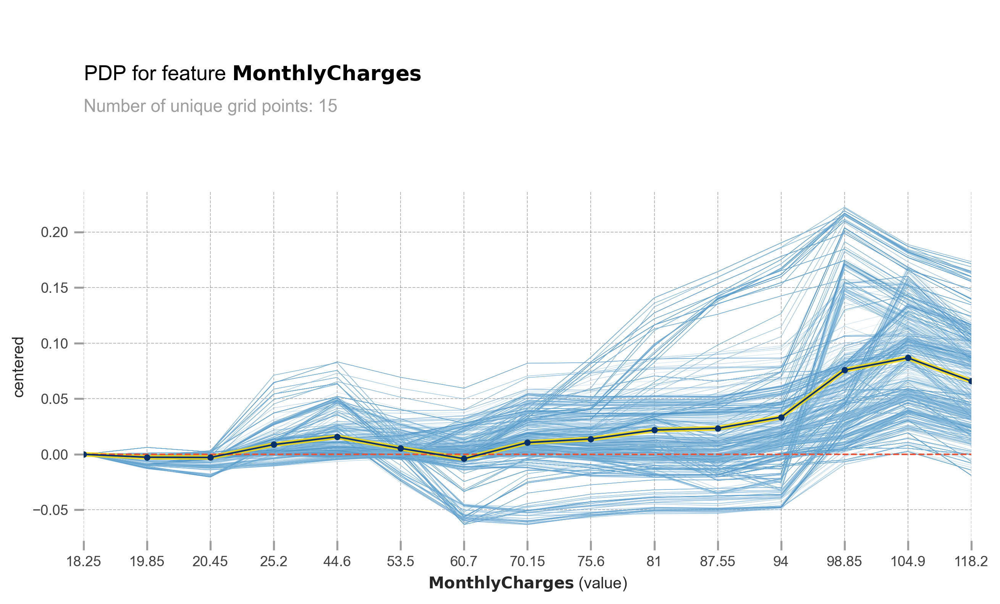

In [95]:
pdp_ice_plot(rf, X_test, 'MonthlyCharges', False)

>The light blue lines represent ICE (Individual Conditional Expectation), and the yellowish blue line represents PDP (Partial Dependence Plot). The X-axis represents MonthlyCharges, while the Y-axis represents the change in prediction probability. At MonthlyCharges of 60.7 USD, you can observe that some customers experience a significant increase in churn probability as the MonthlyCharges increase. However, it is important to note that not all customers have the same response. Some customers are minimally affected, and some may not be affected at all.

obtain pred_func from the provided model.


  0%|          | 0/15 [00:00<?, ?it/s]

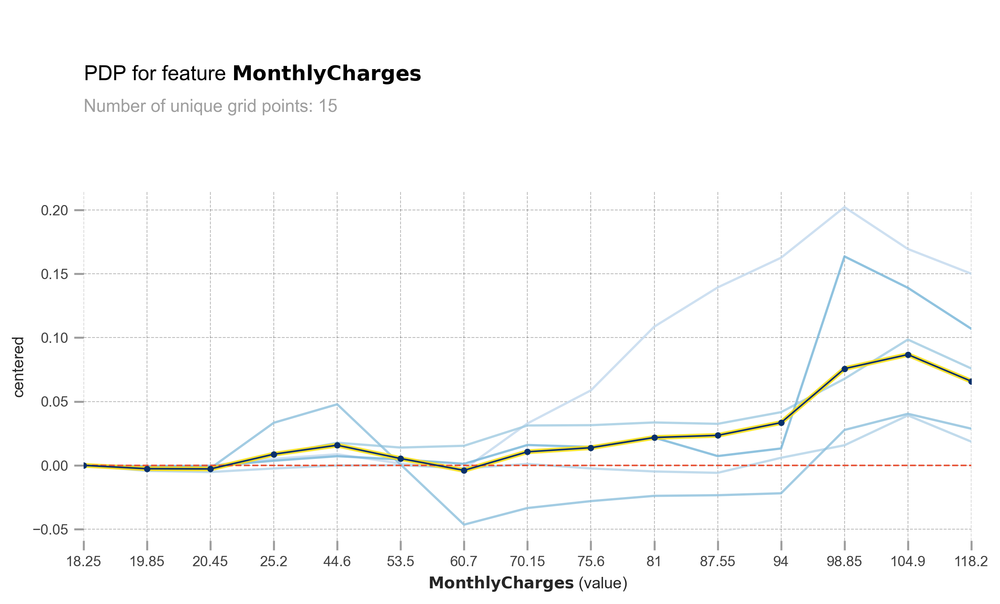

In [96]:
pdp_ice_plot(rf, X_test, 'MonthlyCharges')

>This is the same plot as above, but I have grouped the ICE into 5 clusters for easier viewing and analysis. You can see that there are some customers who experience a significant increase in churn probability as the MonthlyCharges increase.

obtain pred_func from the provided model.


  0%|          | 0/14 [00:00<?, ?it/s]

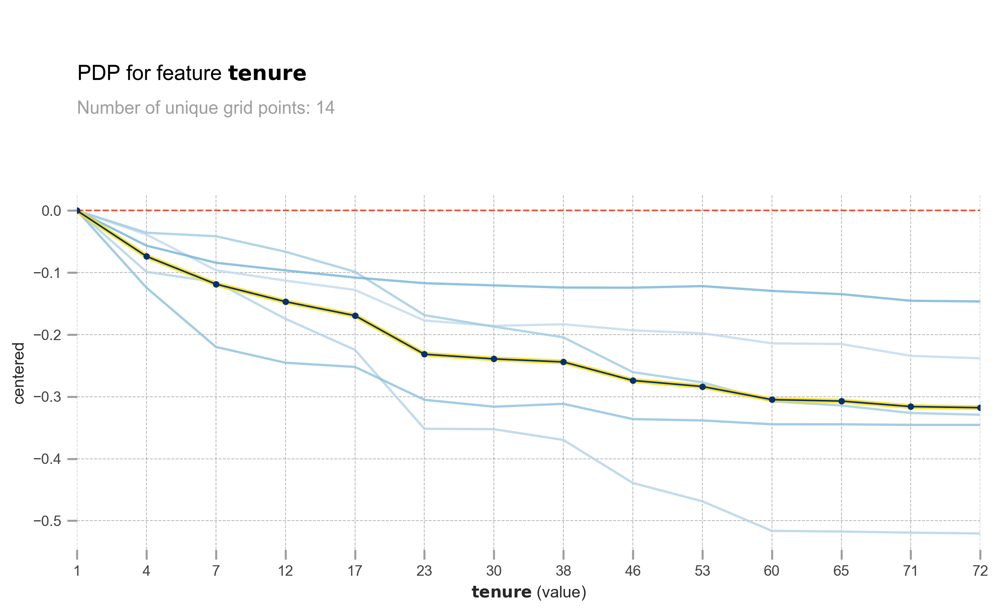

In [97]:
pdp_ice_plot(rf, X_test, 'tenure')

>The longer the tenure, the lower the churn probability. However, the effect is not the same for all customers. Some customers are greatly affected, while others are barely affected.

obtain pred_func from the provided model.


  0%|          | 0/3 [00:00<?, ?it/s]

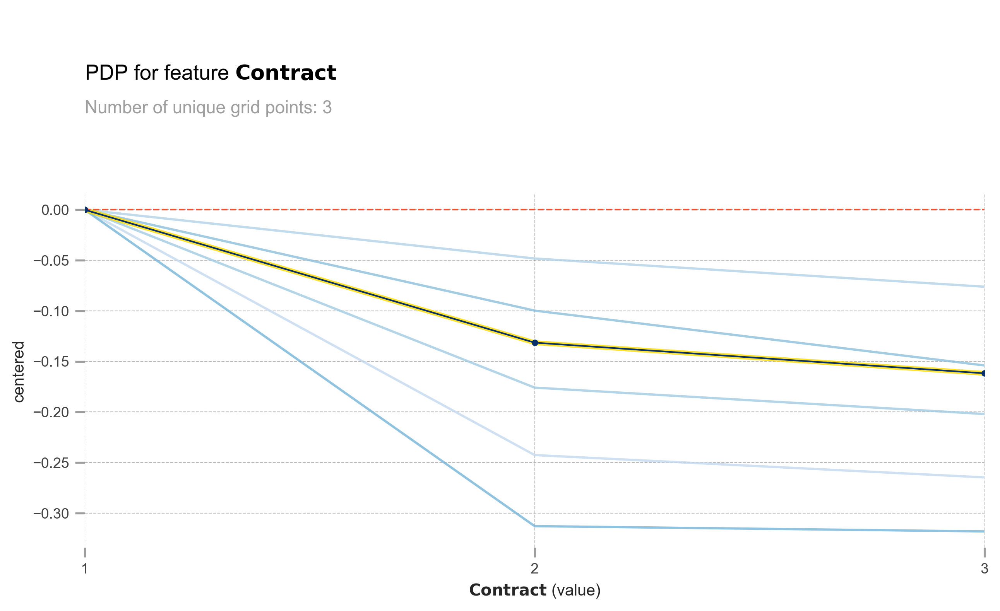

In [98]:
pdp_ice_plot(rf, X_test, 'Contract')

>The same also goes with Contract. Longer contract means lower churn probability. 

obtain pred_func from the provided model.


  0%|          | 0/6 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/6 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/36 [00:00<?, ?it/s]

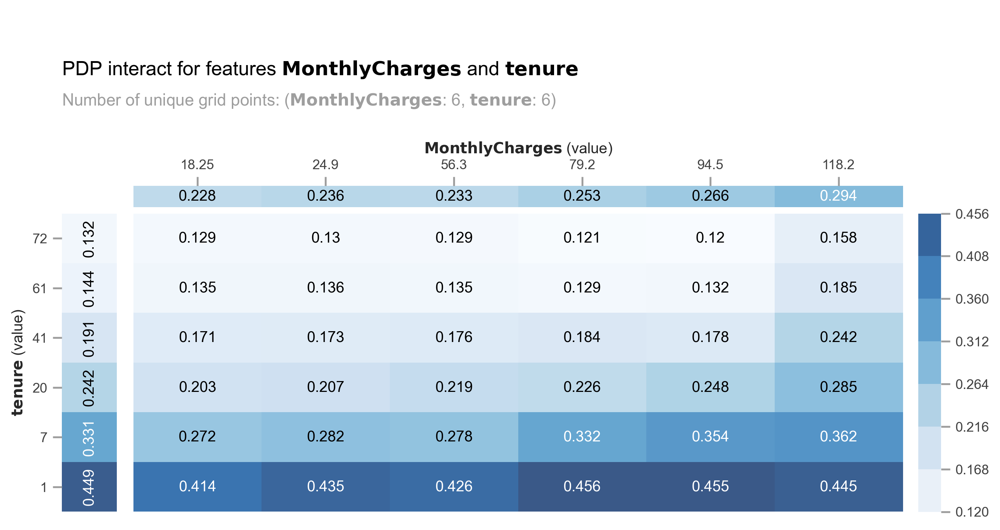

In [99]:
X_test_copy = X_test.copy()
pdp_interact = pdp.PDPInteract(model=rf, df=X_test_copy,
                              num_grid_points=6,
                              model_features = X_test.columns, 
                              features=['MonthlyCharges','tenure'], 
                              feature_names=['MonthlyCharges','tenure'])
pdp_interact.plot(
            plot_type="grid", plot_pdp=True,
            to_bins=True, show_percentile=False,
            which_classes=None, figsize=(10,6),
            dpi=300, ncols=2, plot_params=None, 
            engine='matplotlib', template='plotly_white',
)
plt.show()

>Let's analyze the combination of MonthlyCharges and tenure. We can observe a spike in churn probability for MonthlyCharges ranging from 56.3 USD to 79.2 USD, particularly for customers with a tenure of less than 7 months.

obtain pred_func from the provided model.


  0%|          | 0/10 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/3 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/30 [00:00<?, ?it/s]

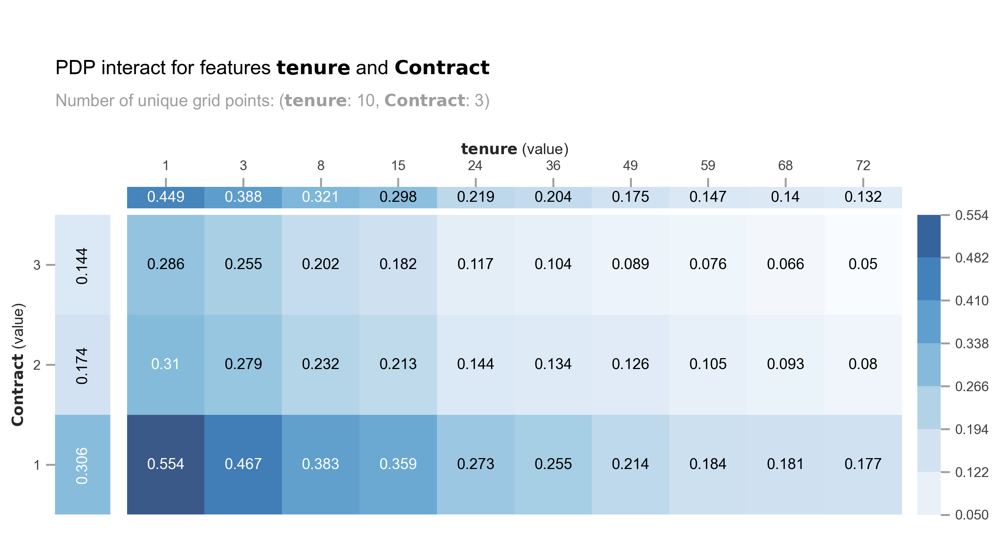

In [100]:
X_test_copy = X_test.copy()
pdp_interact = pdp.PDPInteract(model=rf, df=X_test_copy,
                              num_grid_points=10,
                              model_features = X_test.columns, 
                              features=['tenure','Contract'], 
                              feature_names=['tenure','Contract'])
pdp_interact.plot(
            plot_type="grid", plot_pdp=True,
            to_bins=True, show_percentile=False,
            which_classes=None, figsize=(10,6),
            dpi=300, ncols=2, plot_params=None, 
            engine='matplotlib', template='plotly_white',
)
plt.show()

>The model produces similar churn probabilities for customers with a combination of a 2-year contract and low tenure compared to those with a month-to-month contract and medium tenure (24-36 months).

You can see how PDP and ICE plots can be very beneficial in understanding how the model utilizes features to make predictions. In the next section, I will demonstrate how to assess the model's prediction confidence level.

### Confidence level based on trees' standard deviation and confidence interval.
Tree-based models like RandomForest make predictions by using the mean of all the trees' prediction probabilities. However, instead of solely relying on the mean, we can also calculate the standard deviation. A higher standard deviation indicates lower confidence in the predictions. Additionally, we can utilize confidence intervals, such as 95% or even more extreme at 99%.

In [122]:
#extract all trees' prediction probability per row
predict = np.stack([x.predict_proba(X_test)[:,1] for x in rf.estimators_])

In [123]:
#assign mean and std. deviation of trees' prediction probability.
df_pred = X_test.copy()
df_pred['avg'] = np.round(np.mean(predict, axis = 0) * 100, 2)
df_pred['std_dev'] = np.round(np.std(predict, axis = 0) * 100, 2)

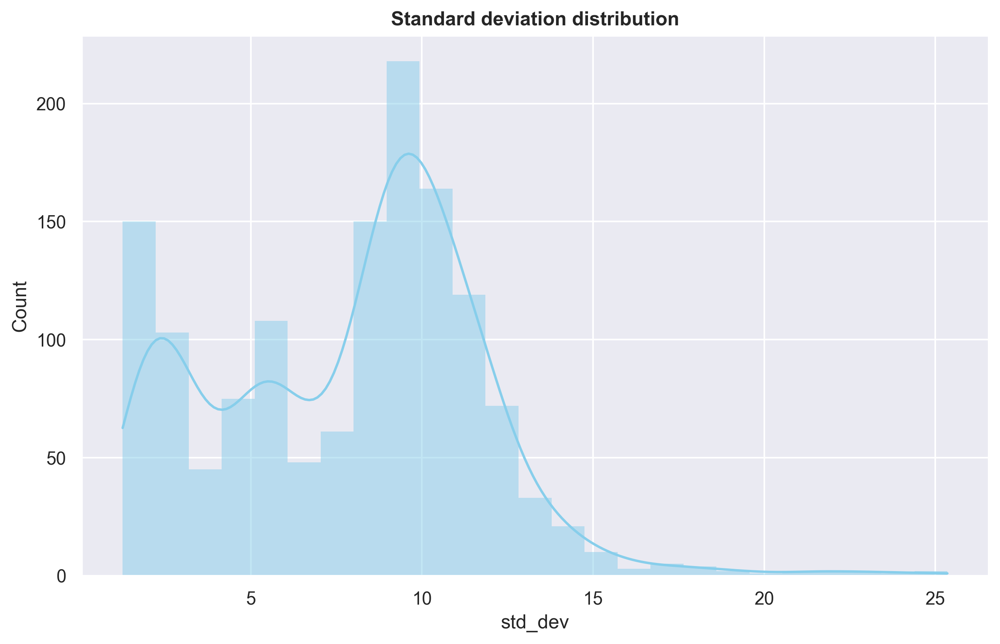

In [124]:
plt.figure(figsize=(10,6))
sns.histplot(df_pred['std_dev'],color='skyblue', kde=True, edgecolor='none')
plt.title('Standard deviation distribution', weight='bold')
plt.show()

>Most of predictions have std.deviation under 10%. Let's calculate confidence interval with 99%.

In [125]:
df_pred['CI-99%'] = (2.576 * df_pred['std_dev'] / np.sqrt(len(predict))) * 100 / (df_pred['avg'])

In [127]:
df_pred[df_pred.avg > 40].sort_values('CI-99%', ascending=False).head(5)

,Contract,tenure,Fiber_optic,MonthlyCharges,FO_LB,No_internet,avg,std_dev,CI-99%
852,2,7,1,94.05,1,0,40.06,25.08,10.199818
499,1,58,1,98.70,1,0,41.05,18.24,7.239149
1186,1,59,1,101.10,1,0,40.37,16.73,6.751699
1137,1,15,1,96.30,0,0,48.14,19.69,6.663701
1184,1,10,1,92.50,0,0,48.17,19.12,6.466765


>Let's consider the example of row 1. The model predicts a 40% probability of churn for the customer, with a confidence interval of +- 10%. By default, the model's output indicates that the customer will not churn. However, due to the high confidence interval, it is safer to assume that the customer will churn.

**Checking the standard deviation and confidence interval of the trees is extremely useful, particularly when the cost of 'False Negative' is significant and can have severe consequences.**